# Assignment 2: Improving the Machine Learning Pipeline

Ari Anisfeld

In [1]:
import pandas as pd
import numpy as np
import pylab as pl
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import svm, datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import math

import pipeline.magicloops as magic
import pipeline.util as u
import pipeline.process as pr
import pipeline.read as r
import pipeline.explore as ex
import pipeline.evaluate as ev
% matplotlib inline


data = r.read_csv('data/credit-data.csv', parse_zipcodes=["zipcode"], dtype ={"SeriousDlqin2yrs": "category","PersonID":"category"})
data.serious_dlqin2yrs.cat.categories = ["Nondelinquent", "Delinquent"]

data = r.read_csv('data/credit-data.csv', parse_zipcodes=["zipcode"], dtype ={"PersonID":"category"})
#data.serious_dlqin2yrs.cat.categories = ["Nondelinquent", "Delinquent"]
data["debt_ratio_groups"] = pr.cut(data.debt_ratio, [0,0.25,.5,.75,1], labels="auto")

# This apply function is too slow.
# data.debt_ratio = data.debt_ratio.apply(lambda x: pr.cap_values(x,data.debt_ratio.quantile(.99)))

#Fill Na with mean for monthly income and median for number of dependents
na_cols = ["monthly_income","number_of_dependents"]
data[na_cols] = pr.fill_with(df=data,col=na_cols, group="serious_dlqin2yrs")


#binnerize number of dependents data and then make dummies.
data["number_of_dependents_cut"] = pr.cut(data.number_of_dependents, [0,.99,3.01,20.1], \
                                          method=pd.cut, labels=["No dependents","1-3 dependents", "4+ dependents"],include_lowest=True)
data = pr.get_dummies(data.number_of_dependents_cut, data)

df = data
potential_features = list(data.columns[2:14])
y = df.serious_dlqin2yrs
X =df[potential_features].join(df.monthly_income.map(lambda x: math.log(x) if x!=0 else 0), rsuffix="_log")




/Users/arianisfeld/anaconda2/envs/py36/lib/python3.6/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/arianisfeld/anaconda2/envs/py36/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/Users/arianisfeld/anaconda2/envs/py36/lib/python3.6/site-packages/sklearn/grid_search.py:43: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the re


# Explore Data

The below table shows outcomes split by data labeled delinquent or nondelinquent. The number of times delinquents are past due is an order of magnitude higher than nondelinquents, but the high variance on the measure and low median suggest that is driven by people with particularly high numbers of past due bills. Nondelinquents are older and have higher income on average.

In [3]:
summary = x.summary_by_outcome(data, "serious_dlqin2yrs")

summary.ix[:,[0,1,2,4,6,7,8,10]]

serious_dlqin2yrs                           Nondelinquent                     \
                                                    count     mean       std   
age                                              139974.0    52.75     14.79   
debt_ratio                                       139974.0   357.15   2083.28   
monthly_income                                   111912.0  6747.84  14813.50   
number_of_dependents                             136229.0     0.74      1.11   
number_of_open_credit_lines_and_loans            139974.0     8.49      5.11   
number_of_time30-59_days_past_due_not_worse      139974.0     0.28      2.95   
number_of_time60-89_days_past_due_not_worse      139974.0     0.13      2.90   
number_of_times90_days_late                      139974.0     0.14      2.91   
number_real_estate_loans_or_lines                139974.0     1.02      1.11   
revolving_utilization_of_unsecured_lines         139974.0     6.17    256.13   

serious_dlqin2yrs                                    Delinquent           \
                                                 50%      count     mean   
age                                            52.00    10026.0    45.93   
debt_ratio                                      0.36    10026.0   295.12   
monthly_income                               5466.00     8357.0  5630.83   
number_of_dependents                            0.00     9847.0     0.95   
number_of_open_credit_lines_and_loans           8.00    10026.0     7.88   
number_of_time30-59_days_past_due_not_worse     0.00    10026.0     2.39   
number_of_time60-89_days_past_due_not_worse     0.00    10026.0     1.83   
number_of_times90_days_late                     0.00    10026.0     2.09   
number_real_estate_loans_or_lines               1.00    10026.0     0.99   
revolving_utilization_of_unsecured_lines        0.13    10026.0     4.37   

serious_dlqin2yrs                                              
                                                 std      50%  
age                                            12.92    45.00  
debt_ratio                                   1238.36     0.43  
monthly_income                               6171.72  4500.00  
number_of_dependents                            1.22     0.00  
number_of_open_credit_lines_and_loans           5.65     7.00  
number_of_time30-59_days_past_due_not_worse    11.73     0.00  
number_of_time60-89_days_past_due_not_worse    11.75     0.00  
number_of_times90_days_late                    11.76     0.00  
number_real_estate_loans_or_lines               1.43     1.00  
revolving_utilization_of_unsecured_lines      131.84     0.84

In [4]:
null_income = u.check_nulls(data, "monthly_income")
null_sum = x.summary_by_outcome(null_income, "serious_dlqin2yrs")

not_null_income = u.get_notnulls(data, "monthly_income")
not_null_sum = x.summary_by_outcome(not_null_income, "serious_dlqin2yrs")
ratio = round(null_sum.ix[:,[0,1,2,5,6,7,8,11]]/not_null_sum.ix[:,[0,1,2,5,6,7,8,11]],2)
ratio.drop("monthly_income")

serious_dlqin2yrs                           Nondelinquent                      \
                                                    count   mean    std   max   
age                                                  0.25   1.10   1.06  1.06   
debt_ratio                                           0.25  62.04  10.12  5.39   
number_of_dependents                                 0.22   0.37   0.70  0.45   
number_of_open_credit_lines_and_loans                0.25   0.83   0.94  0.78   
number_of_time30-59_days_past_due_not_worse          0.25   1.31   1.85  1.00   
number_of_time60-89_days_past_due_not_worse          0.25   2.40   1.89  1.00   
number_of_times90_days_late                          0.25   2.27   1.88  1.00   
number_real_estate_loans_or_lines                    0.25   0.83   0.92  0.43   
revolving_utilization_of_unsecured_lines             0.25   1.08   0.82  0.44   

serious_dlqin2yrs                           Delinquent                     
                                                 count   mean   std   max  
age                                               0.20   1.01  1.09  0.98  
debt_ratio                                        0.20  77.49  6.67  1.86  
number_of_dependents                              0.18   0.37  0.75  0.75  
number_of_open_credit_lines_and_loans             0.20   0.74  0.94  0.60  
number_of_time30-59_days_past_due_not_worse       0.20   2.32  1.90  1.00  
number_of_time60-89_days_past_due_not_worse       0.20   3.00  1.91  1.00  
number_of_times90_days_late                       0.20   2.74  1.90  1.00  
number_real_estate_loans_or_lines                 0.20   0.69  0.78  0.52  
revolving_utilization_of_unsecured_lines          0.20   2.17  2.12  1.35

The analysis above compares people who have a reported monthly income and those with null monthly incomes. The ratio of missing income data over debt ratio with income data is very large. Those without income data have 62 to 77 times the debt ratio of those with reported data. In general, we would hope these ratios were close to 1. The count data show for each person with missing data there are 4 to 5 people with reported income. In other words, those with missing data make up slightly under 20 percent of our data. I will have to be careful when developing models to account for this discrepancy. For example, in a large project I would compare models with imputed values for the missing income data with dropping the data and would consider capping debt ratios. The graphs below show that the data with nulls has more extreme debt ratios (compare the bottom corners of the following two pair plots). The solution is I will implement will be to group debt ratios.

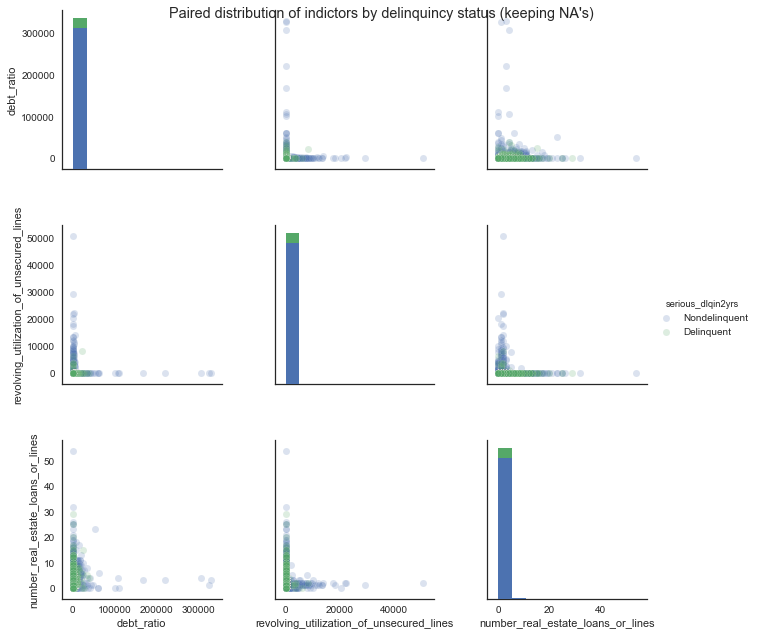

In [7]:
sns.set(style="white")
sns.pairplot(data, vars=["debt_ratio","revolving_utilization_of_unsecured_lines","number_real_estate_loans_or_lines"],\
             hue="serious_dlqin2yrs", size=3, plot_kws={'alpha':0.2})
pl.suptitle("Paired distribution of indictors by delinquincy status (keeping NA's)")

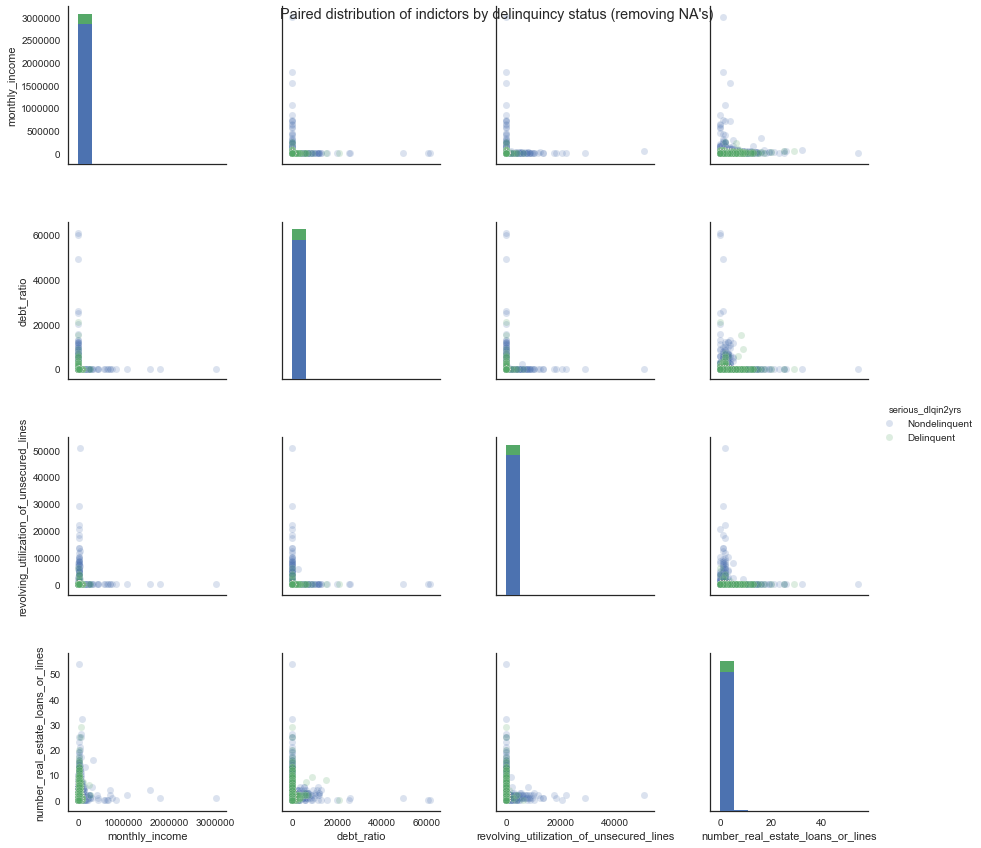

In [8]:
sns.pairplot(u.get_notnulls(data,"monthly_income"), vars=["monthly_income","debt_ratio","revolving_utilization_of_unsecured_lines","number_real_estate_loans_or_lines"],\
             hue="serious_dlqin2yrs", size=3, plot_kws={'alpha':0.2})
pl.suptitle("Paired distribution of indictors by delinquincy status (removing NA's)")

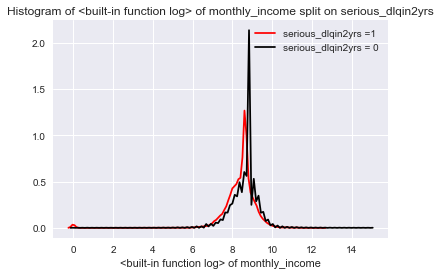

In [109]:
import math

"""normalized_data = data.monthly_income.map(lambda x: math.log(x) if x != 0 else 0)

sns.distplot(normalized_data.loc[data.serious_dlqin2yrs==1], color = 'red', hist=False)
sns.distplot(normalized_data.loc[data.serious_dlqin2yrs==0], color = 'black', hist=False)
plt.xlim = (5, 11)
plt.show()
"""

def no_correction_function(x):
    return x

def my_distplot(df, col, binary_split=None,fn=no_correction_function, hist=False, kde=True):
    '''
    df (dataFrame)
    col (column in dataFrame) we expect values >= 0 
    binary_split (column in df of 0 and 1)
    fn (function) (e.g. math.log, math.sqrt)
    FUTURE: use quantile or other methods to cut outliers
    FUTURE: make arbitrary distinct graphs not just binary
    '''
    normalized_data = df[col].map(lambda x: fn(x) if x > 0 else x)
    if binary_split:
        sns.distplot(normalized_data.loc[df[binary_split]==1], color = 'red', hist=hist,kde=kde, label='{} =1'.format(binary_split))
        sns.distplot(normalized_data.loc[df[binary_split]==0], color = 'black',hist=hist,kde=kde,label='{} = 0'.format(binary_split))
        plt.title("Histogram of {} of {} split on {}".format(fn, col, binary_split))
    else:
        sns.distplot(normalized_data)
        plt.title("Histogram of {} of {}".format(fn, col), label = col)
    if fn==no_correction_function:
        plt.xlabel("{}".format(col))
    else:
        plt.xlabel("{} of {}".format(fn, col))
    plt.legend()
    

    
my_distplot(data, 'monthly_income', 'serious_dlqin2yrs',fn=math.log)


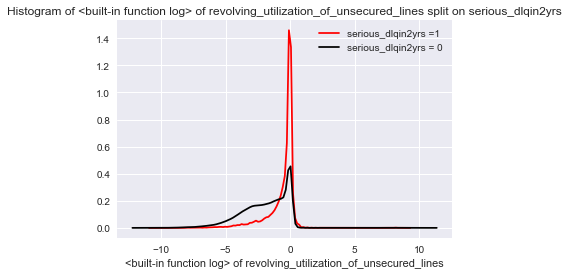

In [106]:
my_distplot(data, 'revolving_utilization_of_unsecured_lines', 'serious_dlqin2yrs',fn=math.log)

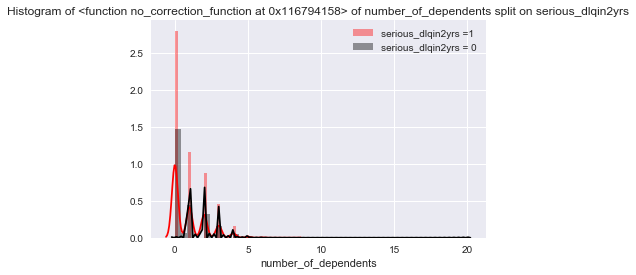

In [111]:
my_distplot(data, 'number_of_dependents', 'serious_dlqin2yrs', hist=True, kde=True)

In [90]:
normalized_data = data.monthly_income.map(lambda x: math.log(x) if x != 0 else 0)

data.loc[data.serious_dlqin2yrs==1]['number_of_dependents'].value_counts()
#sns.distplot(normalized_data.loc[data.serious_dlqin2yrs==0], color = 'black', hist=False)

0.000000    5095
1.000000    1935
2.000000    1584
3.000000     837
4.000000     297
0.948208     179
5.000000      68
6.000000      24
7.000000       5
8.000000       2
Name: number_of_dependents, dtype: int64

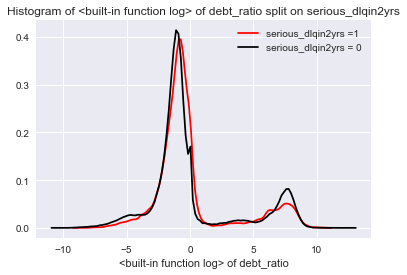

In [81]:
plot_skewed_data(data, 'debt_ratio', 'serious_dlqin2yrs')


# Correlation Plot

The correlation plot shows very strong correlation between the different past-due categories. While age and number of open credit lines and loans are weakly negatively correlated with the past-due categories and uncorrelated with debt ratios, income and number of dependents. Debt ratios, income and number of dependents are postively correlated with number of open credit lines and real estate loans.

I expanded the plot for the second round to include delinquency. Nothing is strongly correlaed with delinquency, though age has the strongest negative correlation.

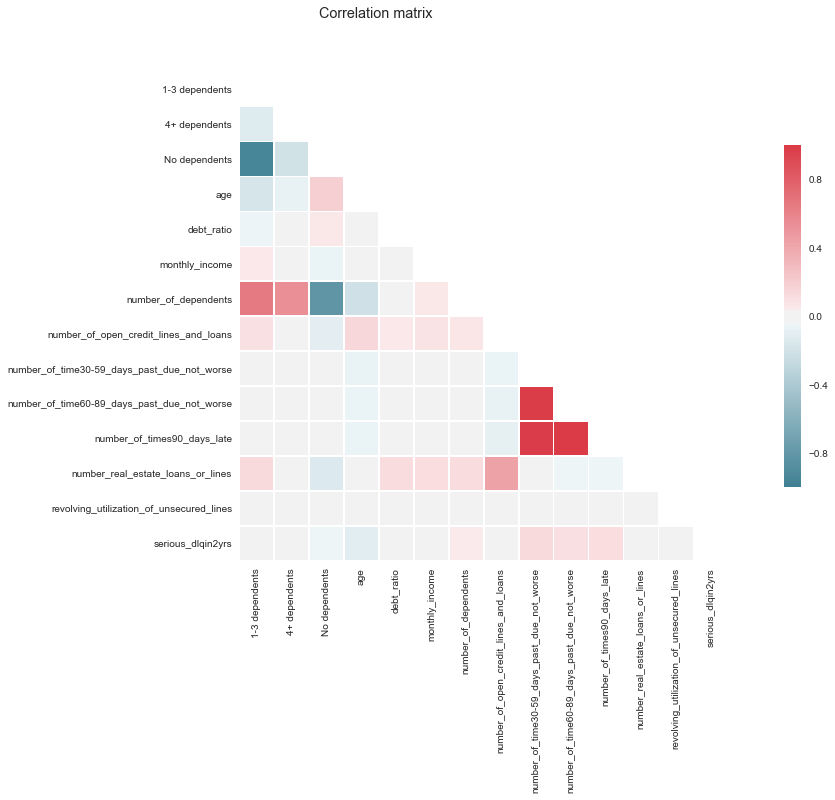

In [182]:
ex.correlation_plot(data)
pl.suptitle("Correlation matrix")

In [10]:
print("Table: Average feature values by zip code")
x.summary_by_outcome(data, "zipcode").iloc[:,1::6]

Table: Average feature values by zip code


zipcode,60601,60618,60625,60629,60637,60644,60657,60804
,mean,mean,mean,mean,mean,mean,mean,mean
age,52.28,52.27,52.33,52.18,52.25,52.22,52.41,52.40
debt_ratio,341.85,342.50,360.24,345.67,338.03,373.64,357.01,357.87
monthly_income,6686.20,6686.42,6616.10,6628.62,6805.49,6595.88,6635.17,6764.87
number_of_dependents,0.76,0.75,0.76,0.76,0.76,0.77,0.76,0.74
number_of_open_credit_lines_and_loans,8.56,8.44,8.45,8.39,8.43,8.46,8.47,8.41
number_of_time30-59_days_past_due_not_worse,0.39,0.42,0.41,0.40,0.46,0.40,0.39,0.51
number_of_time60-89_days_past_due_not_worse,0.20,0.24,0.23,0.22,0.27,0.22,0.22,0.33
number_of_times90_days_late,0.22,0.27,0.26,0.24,0.30,0.25,0.24,0.36
number_real_estate_loans_or_lines,1.02,1.02,1.03,1.01,1.02,1.01,1.02,1.01


On average, we do not see major difference betweeen zip codes, despite representing very differen Chicago neighborhoods. Revolving utilization of unsecured lines is the exception. The results were similar when looking at median. Most zipcodes hovered around 16600 residents in the sample, while 60625 zipcode had double that. Despite this, in the feature generation section, I hoped to make dummies of these. I ran into memory issues however, even after reducing the size of the stored integers and using sparse matrices.

# Feature Generation

In [11]:
data["debt_ratio_groups"] = pr.cut(data.debt_ratio, [0,0.25,.5,.75,1], labels="auto")

# This apply function is too slow.
# data.debt_ratio = data.debt_ratio.apply(lambda x: pr.cap_values(x,data.debt_ratio.quantile(.99)))

#Fill Na with mean for monthly income and median for number of dependents
na_cols = ["monthly_income","number_of_dependents"]
data[na_cols] = pr.fill_with(df=data,col=na_cols, group="serious_dlqin2yrs")


#binnerize number of dependents data and then make dummies.
data["number_of_dependents_cut"] = pr.cut(data.number_of_dependents, [0,.99,3.01,20.1], \
                                          method=pd.cut, labels=["No dependents","1-3 dependents", "4+ dependents"],include_lowest=True)
data = pr.get_dummies(data.number_of_dependents_cut, data)

RF


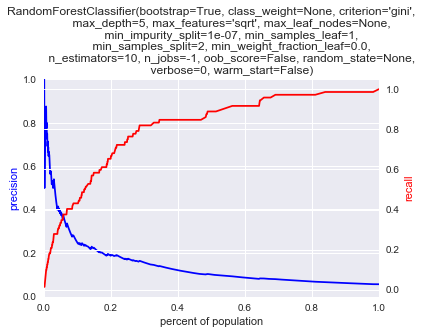

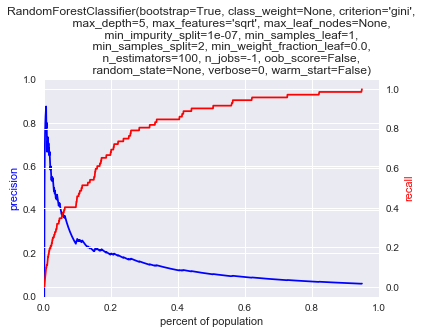

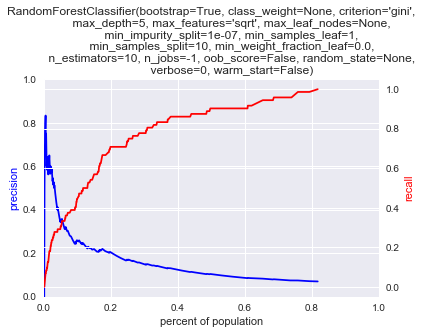

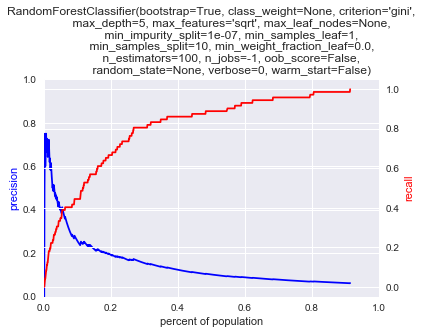

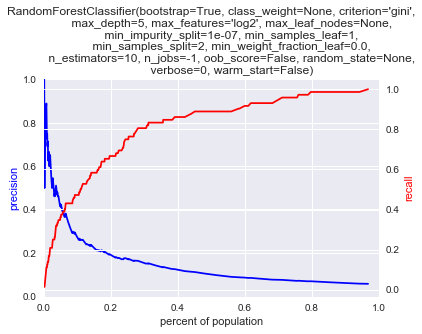

...

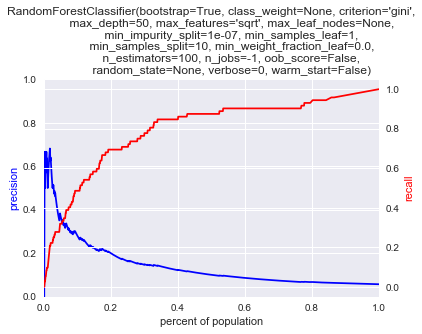

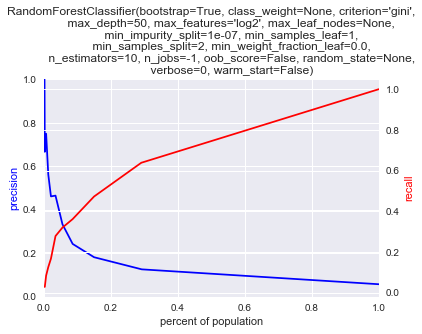

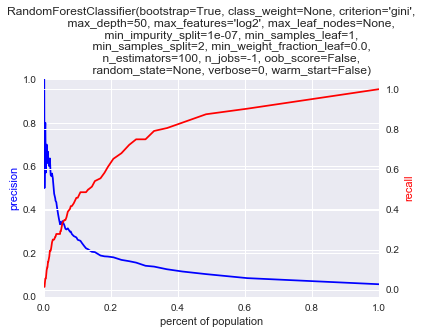

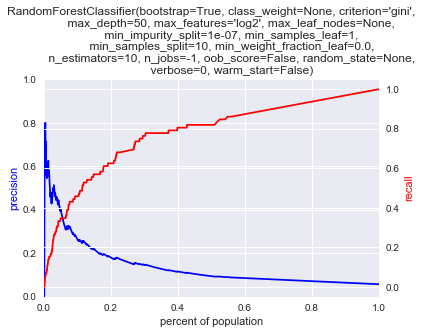

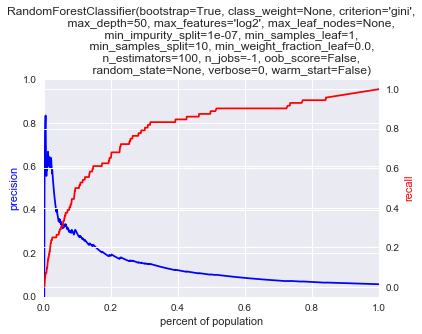

DT


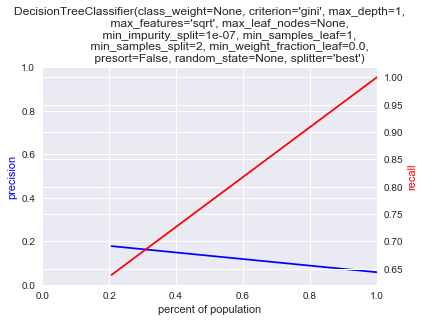

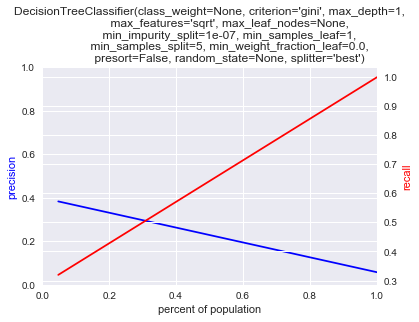

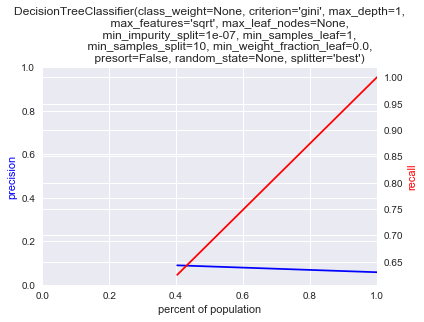

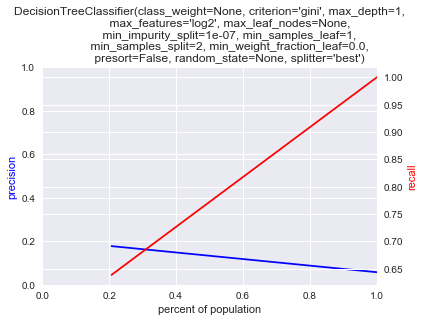

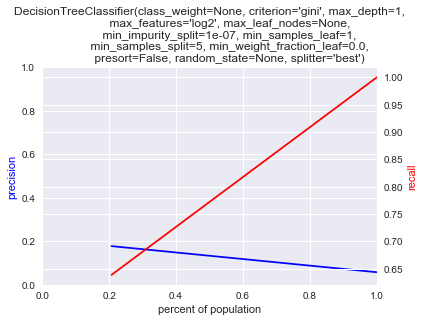

...

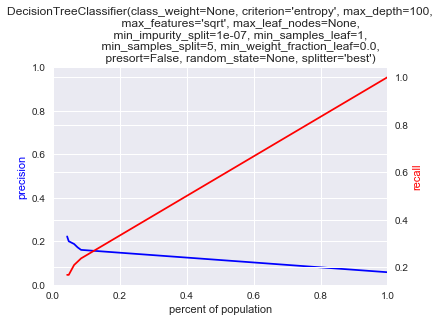

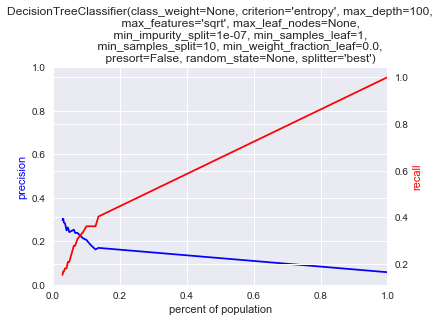

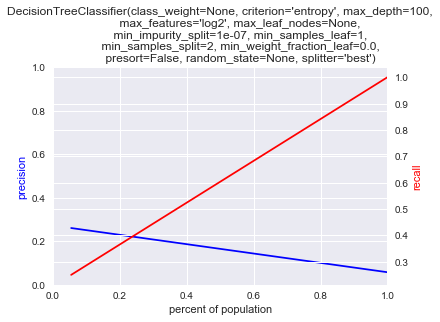

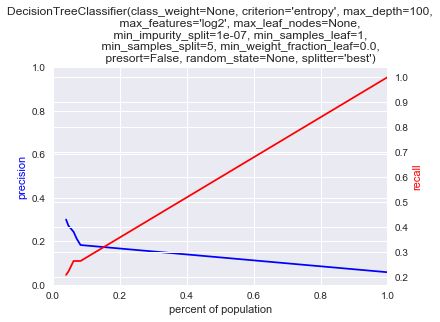

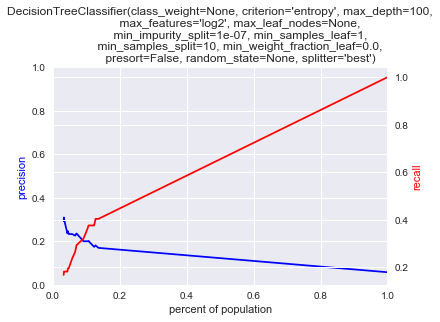

KNN


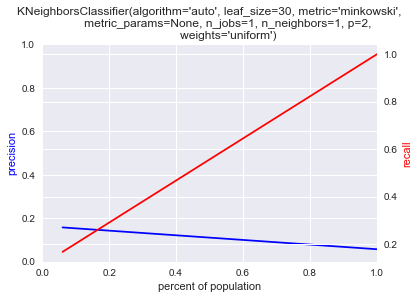

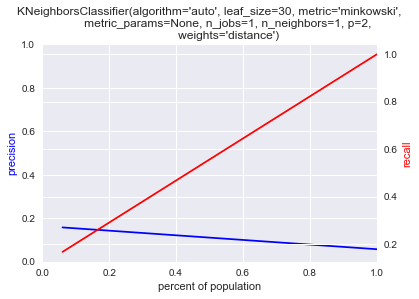

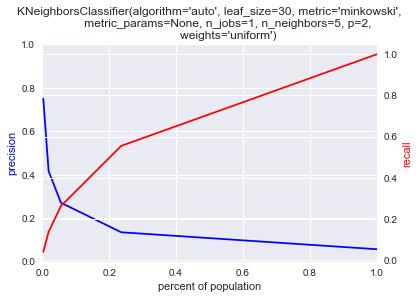

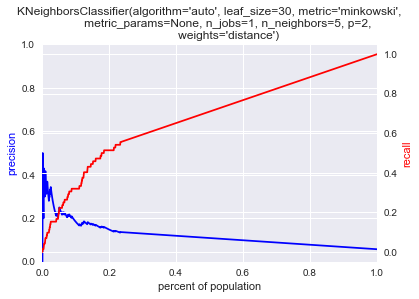

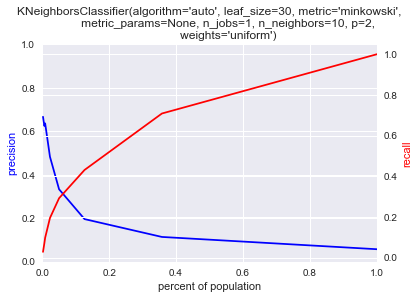

...

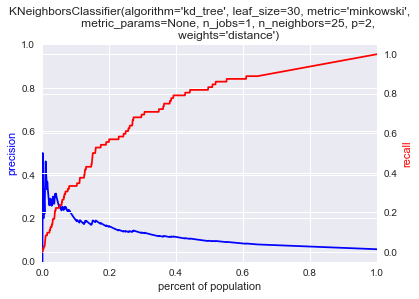

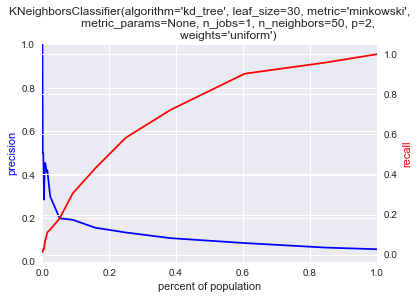

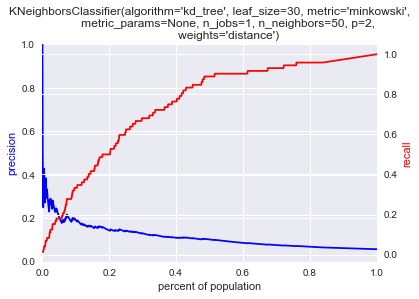

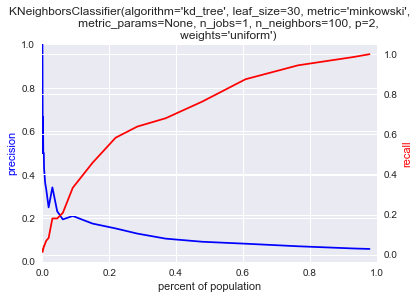

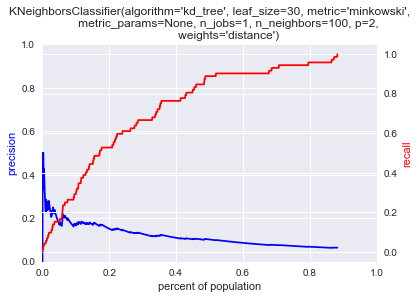

SVM


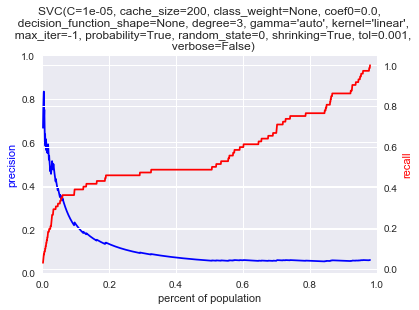

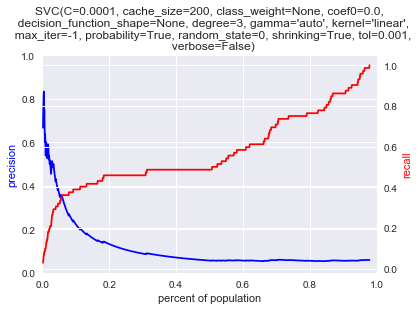

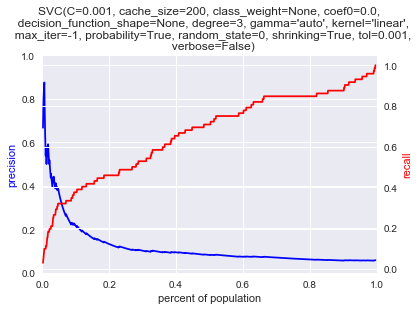

In [ ]:
SOME PRELIMINARY ROC curves. I eventually aborted this run of the small loop in favor of using a terminal overnight.

# Feature Selection

Using a random forest, we can identify the importance of features 


In [2]:
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

#df = u.get_subsample(data, 5000)
df = data
potential_features = list(data.columns[2:14])
y = df.serious_dlqin2yrs
X =df[potential_features].join(df.monthly_income.map(lambda x: math.log(x) if x!=0 else 0), rsuffix="_log")


def rf_feature_selection(X,y):
    '''
    identify important features using a random forest
    
    
    
    This is based on sklearn example code:
    http://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html#sphx-glr-auto-examples-ensemble-plot-forest-importances-py
    '''
    forest = ExtraTreesClassifier(n_estimators=250,
                                  random_state=0)

    forest.fit(X, y)
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    indices = np.argsort(importances)[::-1]

    # Print the feature ranking
    print("Feature ranking:")

    for f in range(X.shape[1]):
        print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

    # Plot the feature importances of the forest
    plt.figure()
    plt.title("Feature importances")
    plt.bar(range(X.shape[1]), importances[indices],
           color="r", yerr=std[indices], align="center")
    plt.xticks(range(X.shape[1]), indices)
    plt.show()

Feature ranking:
1. feature 5 (0.129706)
2. feature 12 (0.124128)
3. feature 0 (0.105268)
4. feature 4 (0.097960)
5. feature 7 (0.090882)
6. feature 1 (0.089481)
7. feature 6 (0.079380)
8. feature 3 (0.065565)
9. feature 2 (0.061315)
10. feature 9 (0.054666)
11. feature 10 (0.043717)
12. feature 8 (0.036002)
13. feature 11 (0.021929)


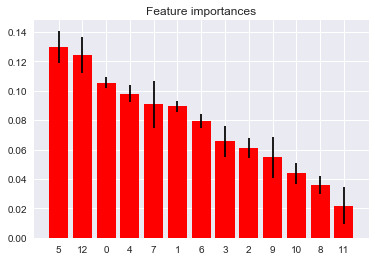

In [10]:
rf_feature_selection(X,y)

Collect top 5 features:
Note feature 12 is log(income) which did about the same as the income measure. It is somewhat surprising that factors that were more correlated with delinquency, such as number of dependents did not show up.  and the other "number of days past due" were not as important. The debt ratio groups, which discretized debt ratios, appears as the least useful. 

In [3]:
features = []
for x in [5,0,4,1,7]:
    features.append(potential_features[x])  
features

['monthly_income',
 'revolving_utilization_of_unsecured_lines',
 'debt_ratio',
 'age',
 'number_of_times90_days_late']

RF


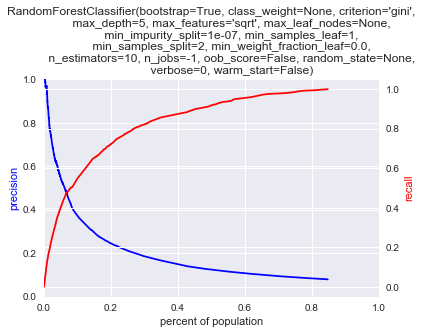

0.6447460651397705


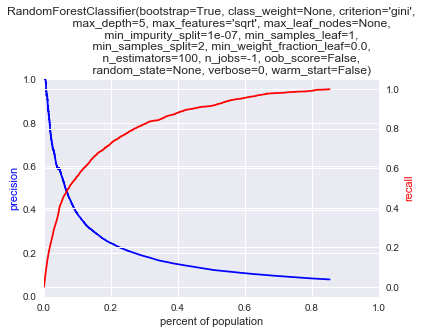

5.075011968612671


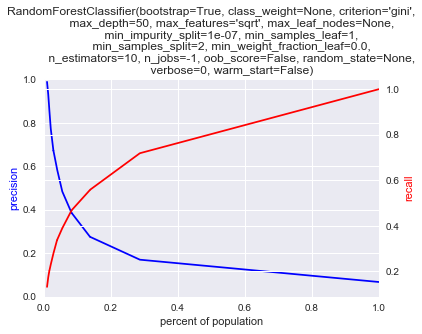

1.2657949924468994


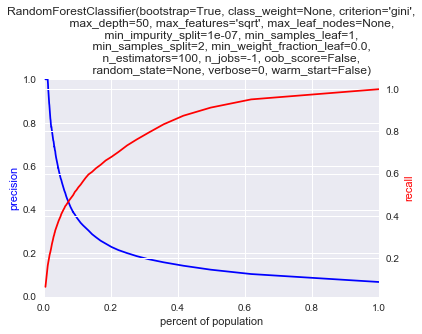

10.701249122619629
DT


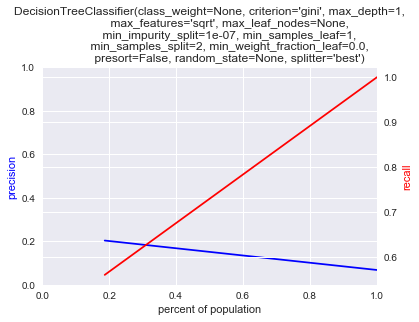

0.04580402374267578


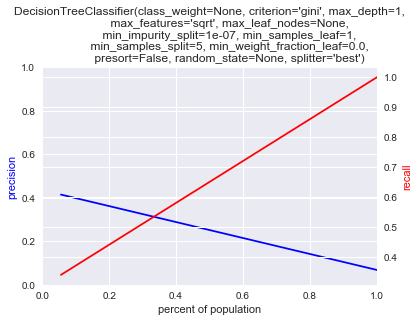

0.0436711311340332


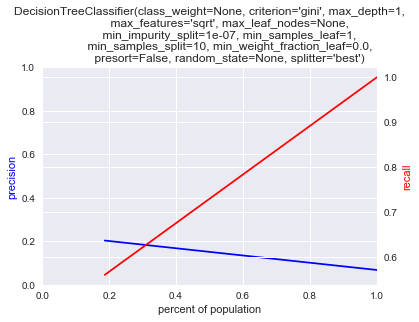

0.03754591941833496


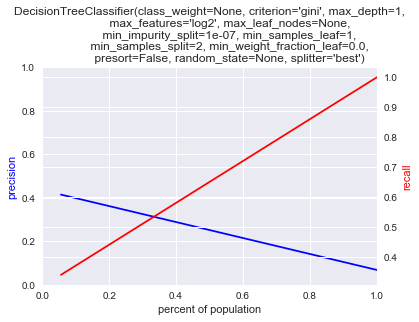

0.036607980728149414


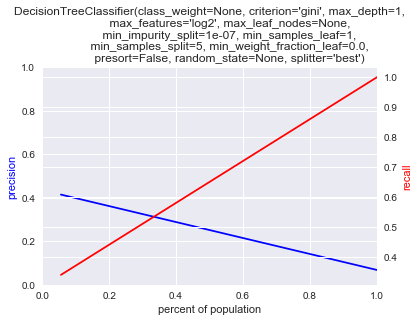

0.036531925201416016


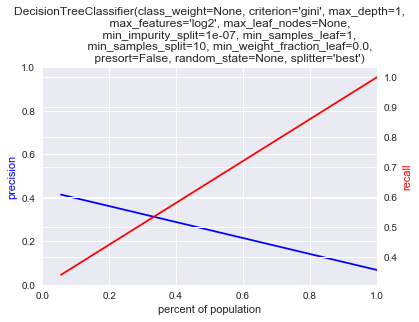

0.028322696685791016


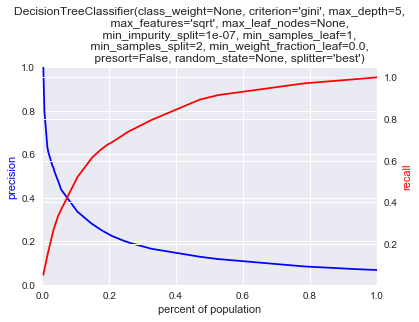

0.11075377464294434


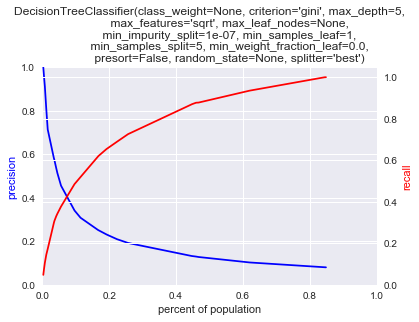

0.12203407287597656


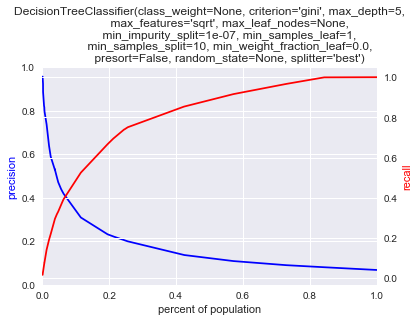

0.10184407234191895


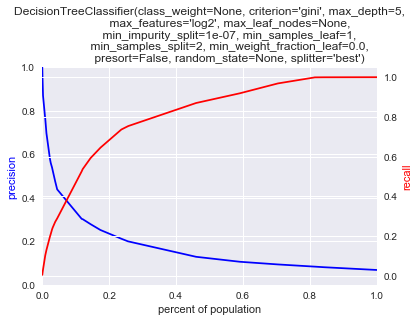

0.11371278762817383


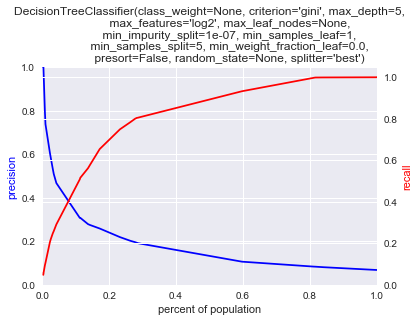

0.1071779727935791


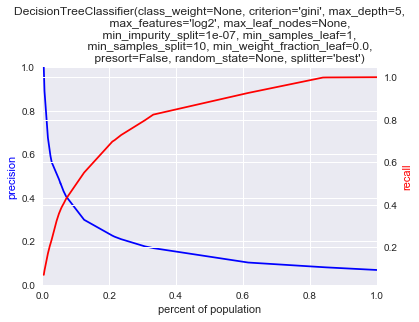

0.12320399284362793


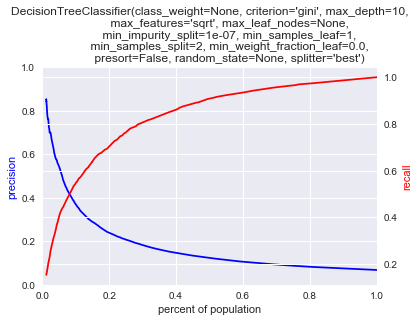

0.18340301513671875


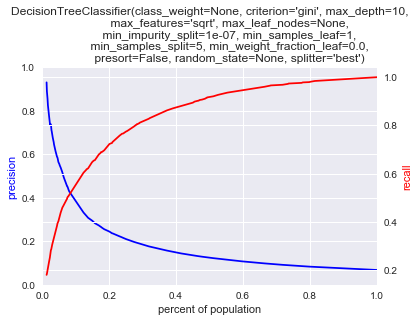

0.19534015655517578


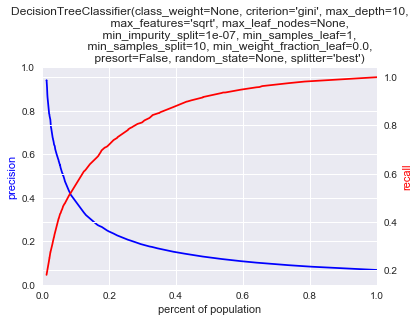

0.18133783340454102


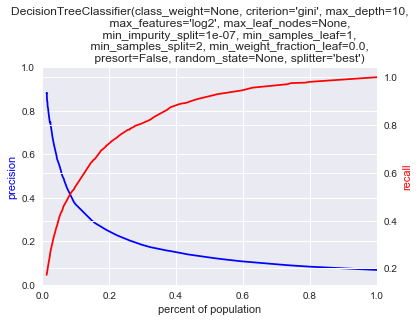

0.18625307083129883


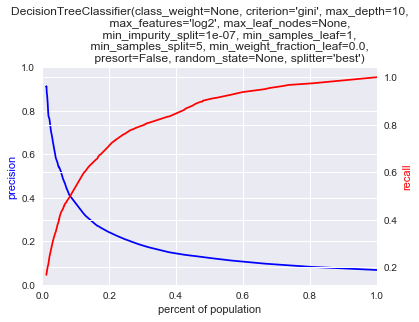

0.17311787605285645


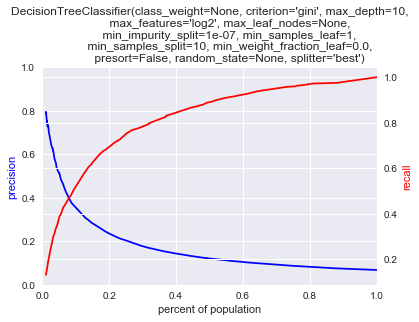

0.1850602626800537


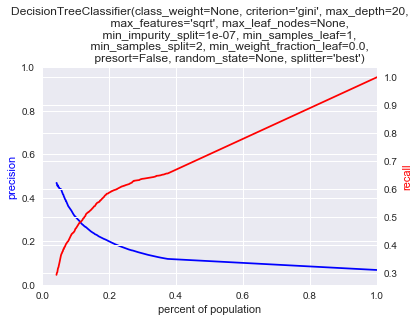

0.2927360534667969


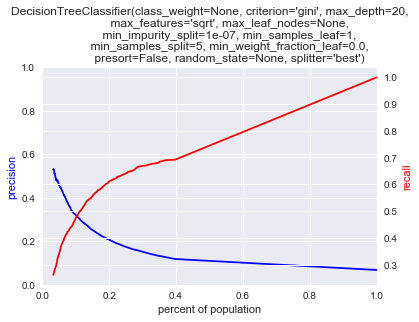

0.2920651435852051


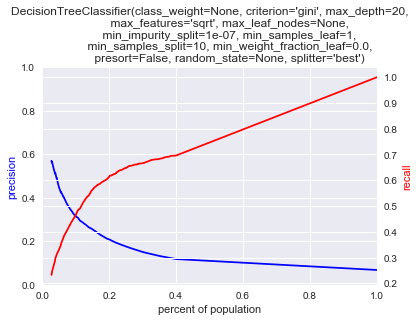

0.302839994430542


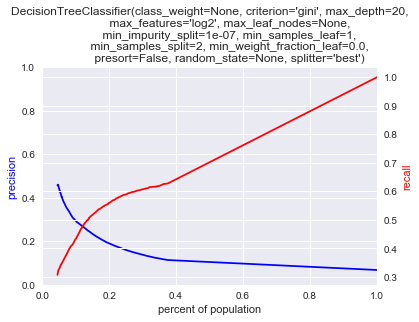

0.3192329406738281


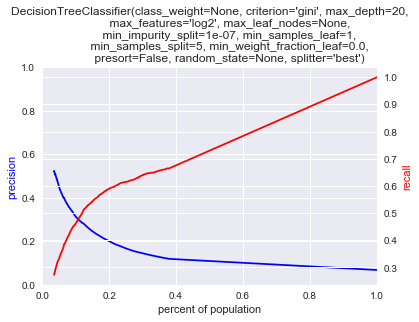

0.2920670509338379


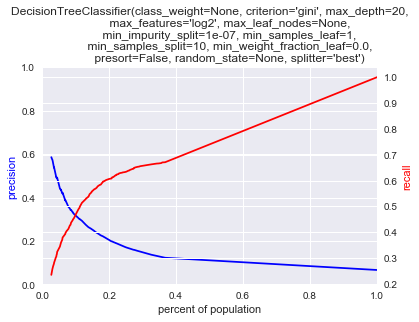

0.298123836517334


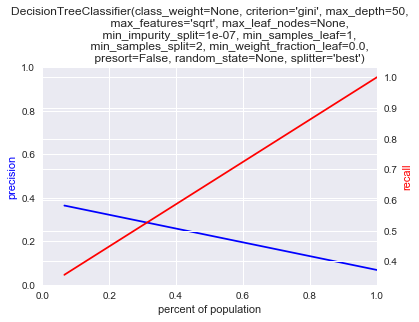

0.3668038845062256


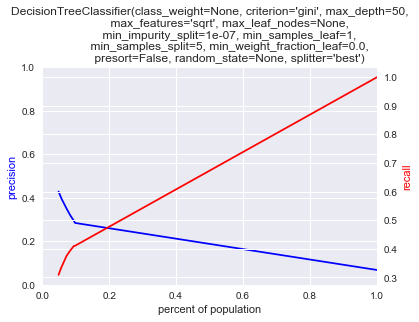

0.31226396560668945


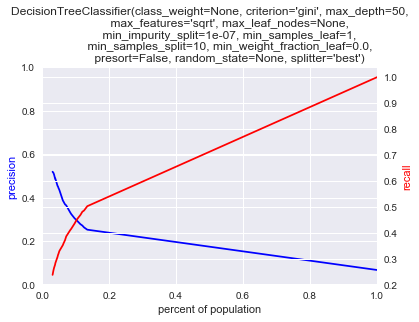

0.29949402809143066


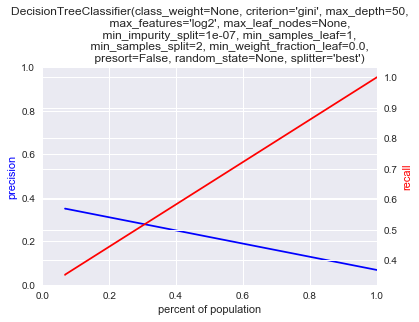

0.3340940475463867


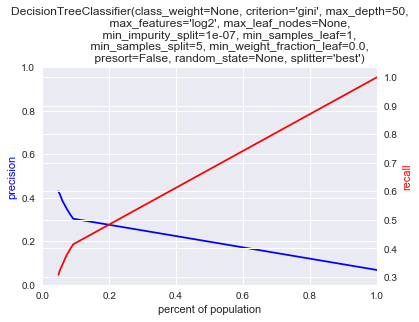

0.2936289310455322


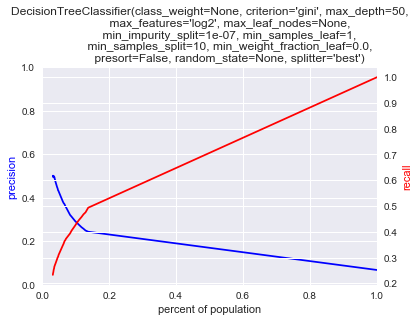

0.2754971981048584


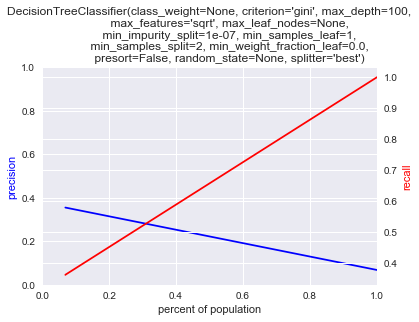

0.32823801040649414


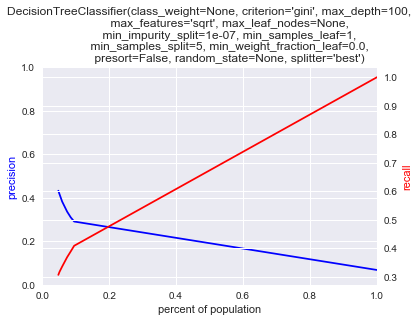

0.3257601261138916


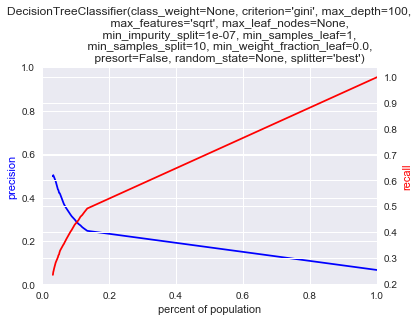

0.33468008041381836


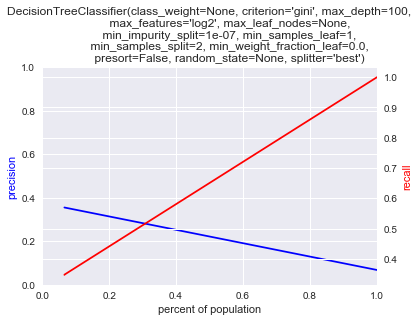

0.4346771240234375


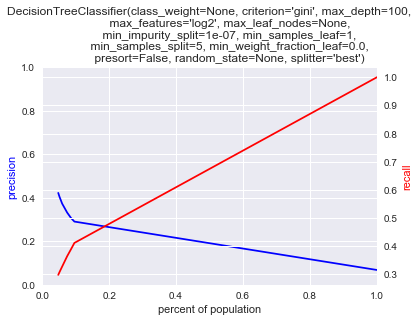

0.4944000244140625


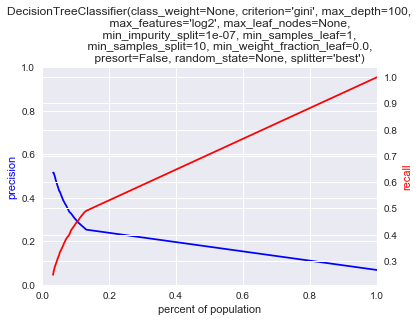

0.3661460876464844


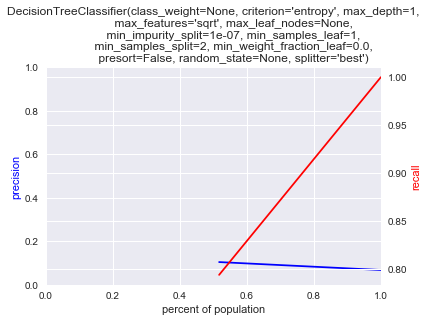

0.06364893913269043


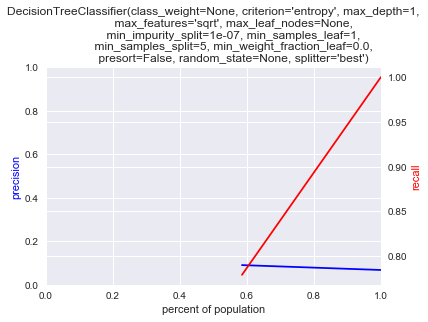

0.053347110748291016


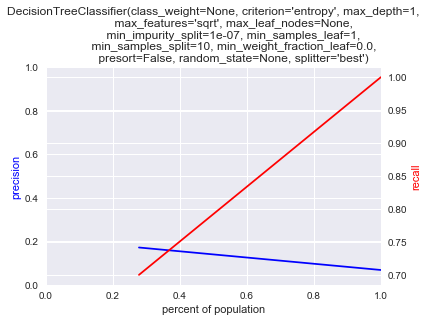

0.06513476371765137


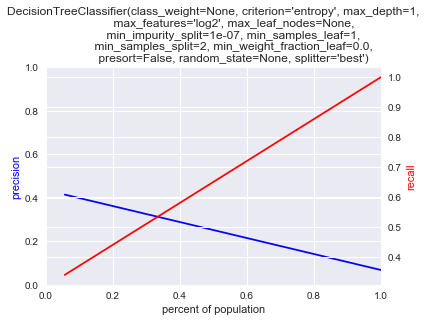

0.09537792205810547


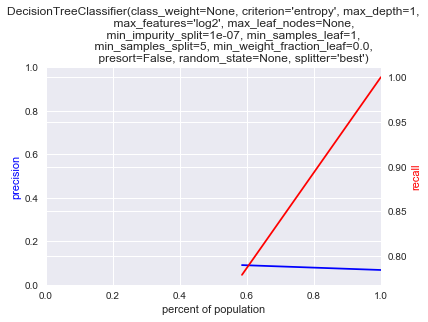

0.08621692657470703


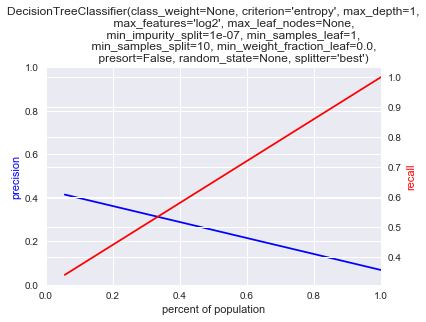

0.04143786430358887


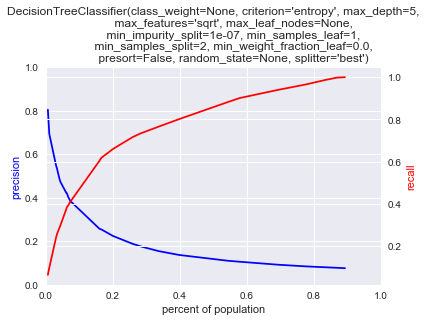

0.21609091758728027


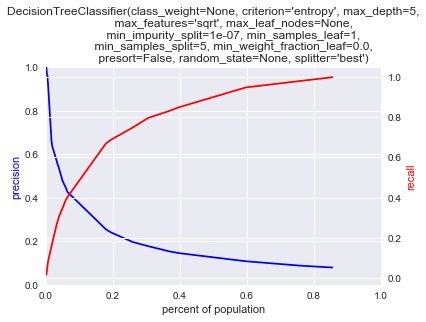

0.2253279685974121


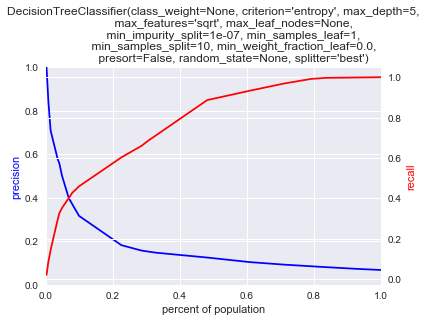

0.1295027732849121


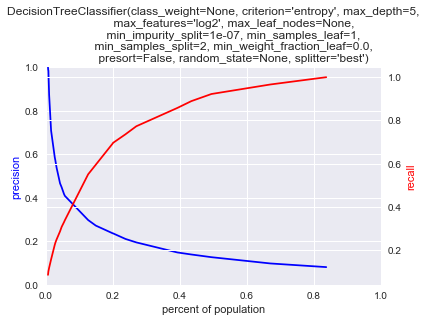

0.30709314346313477


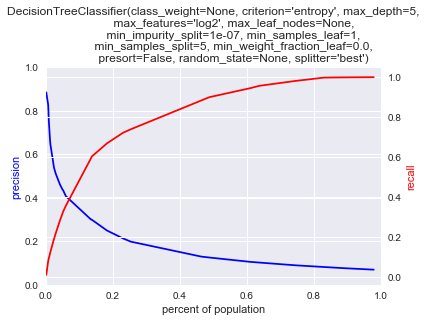

0.21965813636779785


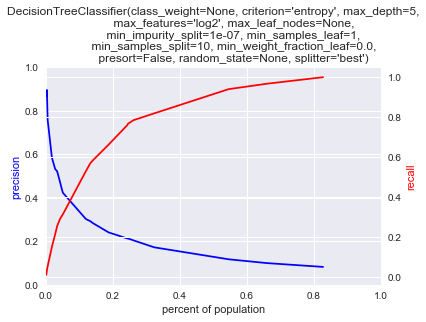

0.17506098747253418


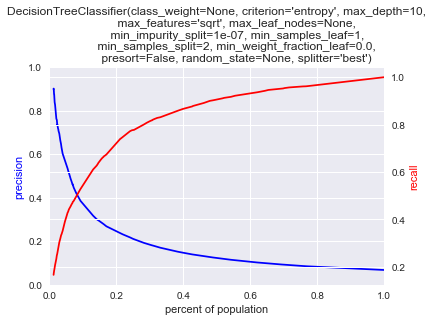

0.2812199592590332


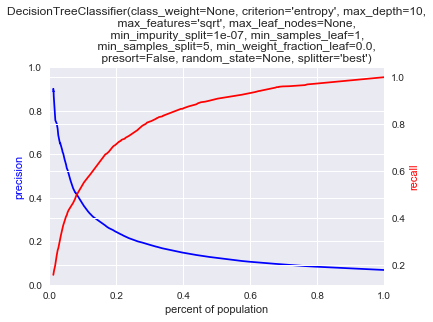

0.28568291664123535


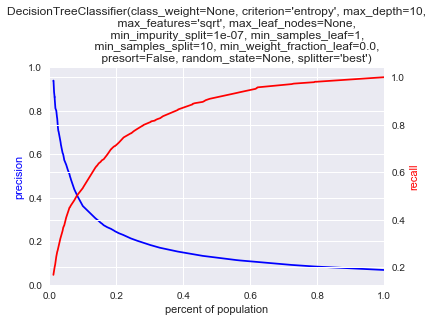

0.34685707092285156


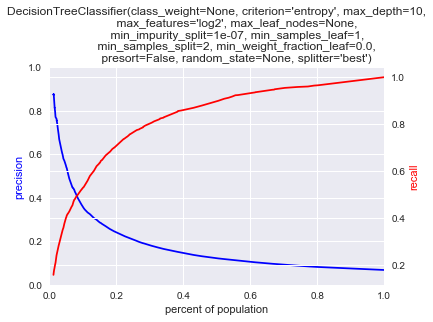

0.2396841049194336


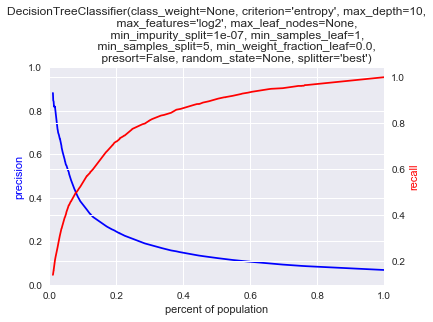

0.3852972984313965


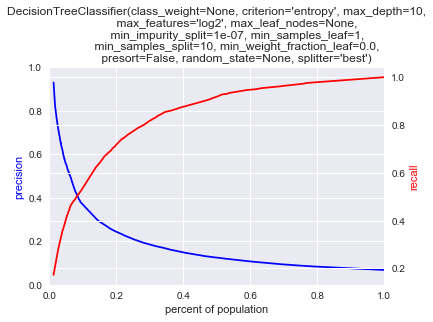

0.4224059581756592


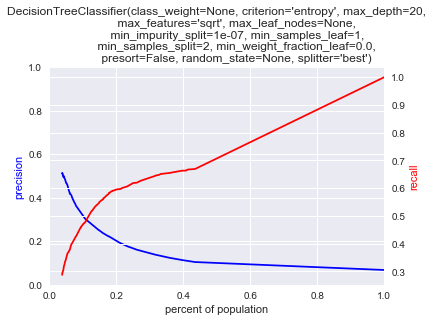

0.719235897064209


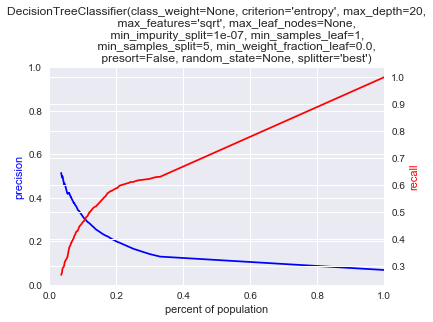

0.5732171535491943


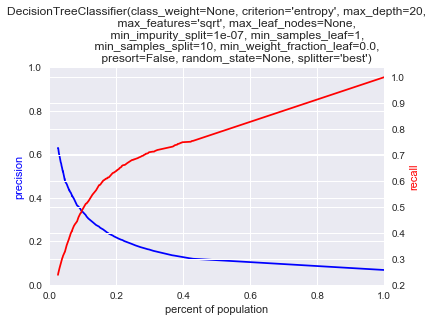

0.5679230690002441


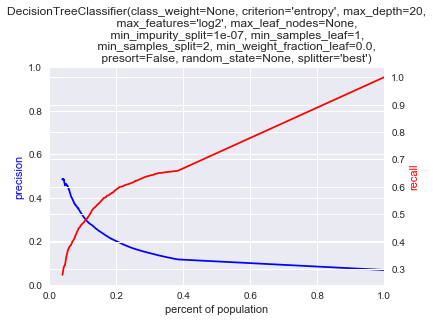

0.5773050785064697


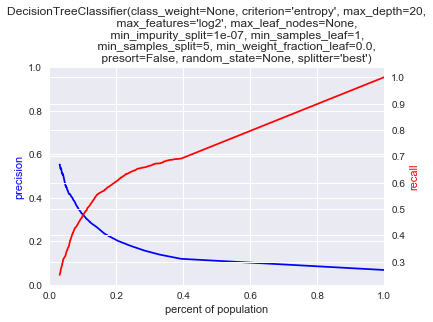

0.5869770050048828


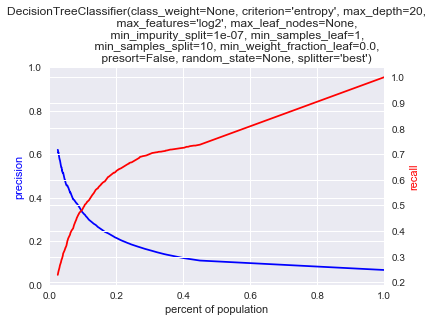

0.6182000637054443


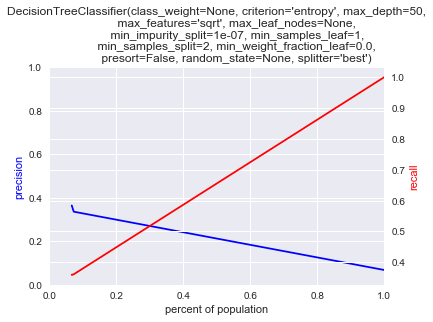

0.7293272018432617


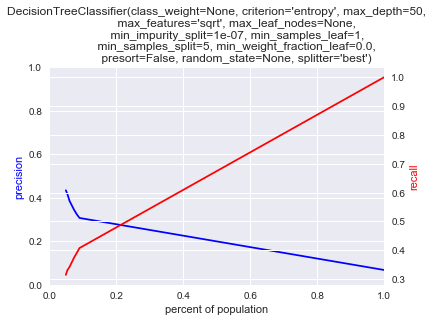

0.6219441890716553


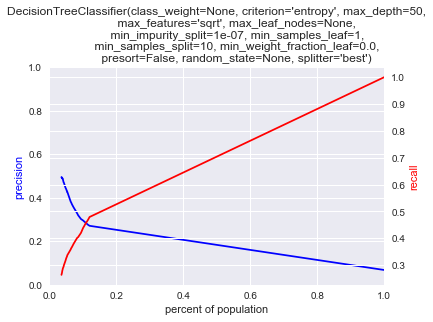

0.6657230854034424


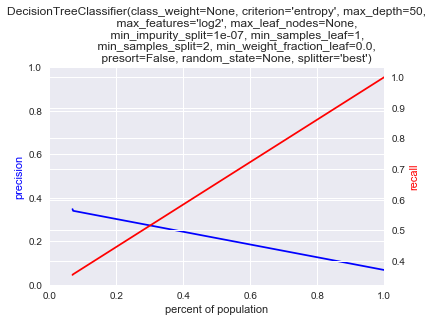

0.7484848499298096


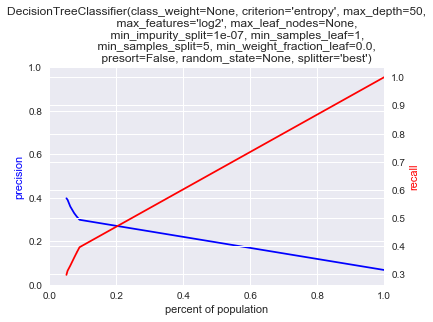

0.547802209854126


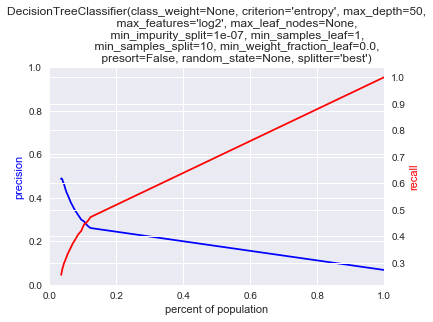

0.43979811668395996


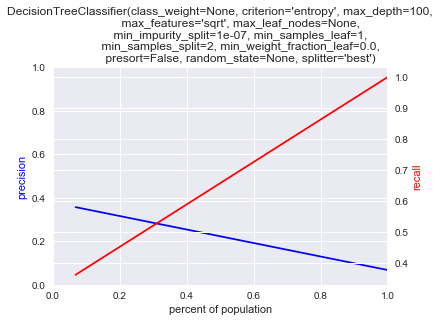

0.3984699249267578


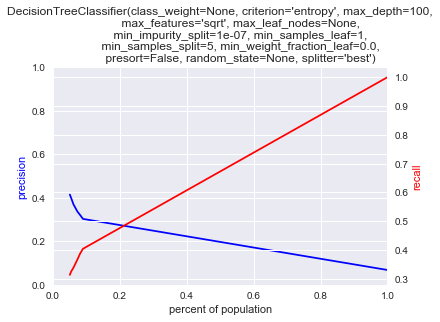

0.365062952041626


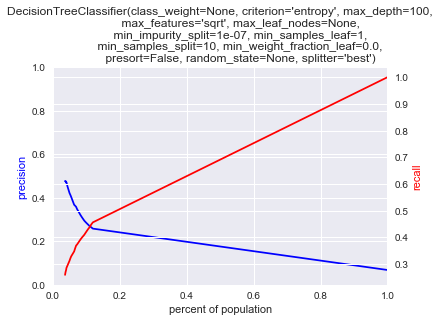

0.40738582611083984


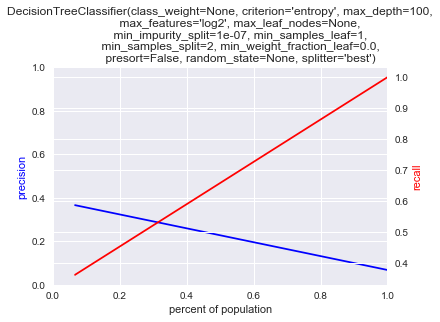

0.34699392318725586


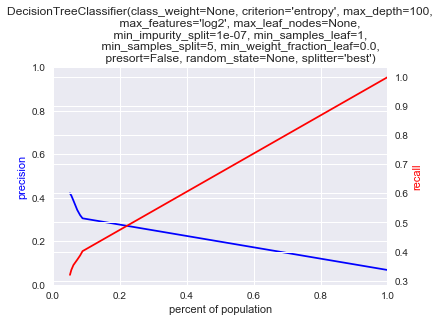

0.42962193489074707


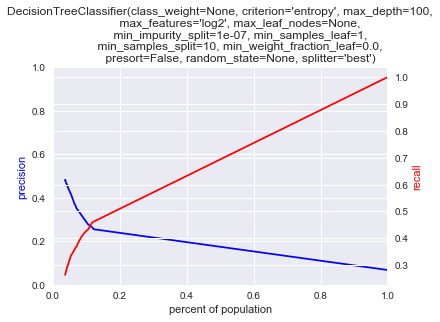

0.4164752960205078
GB


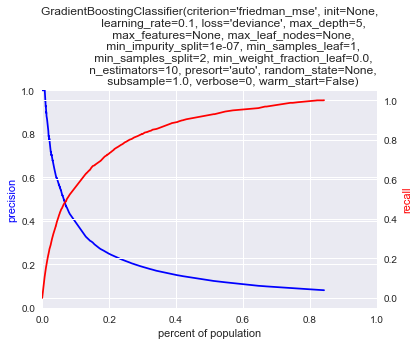

1.6441400051116943


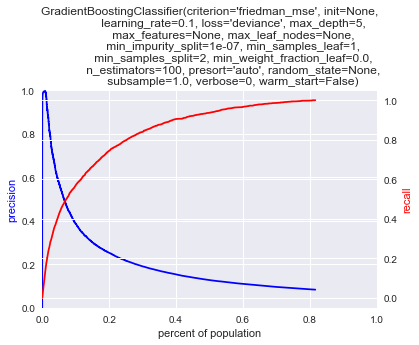

15.19977593421936
LR


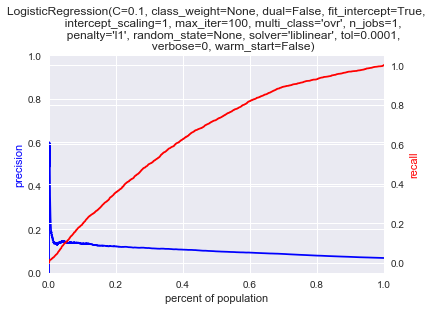

0.2984049320220947


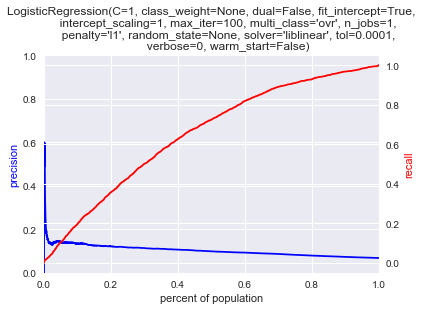

0.3411269187927246


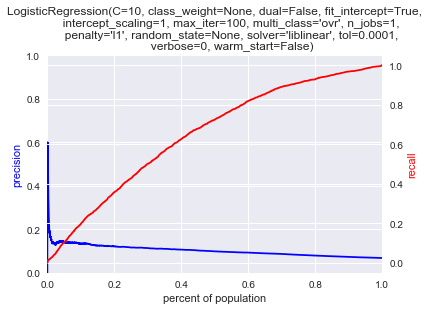

0.3757922649383545
NB


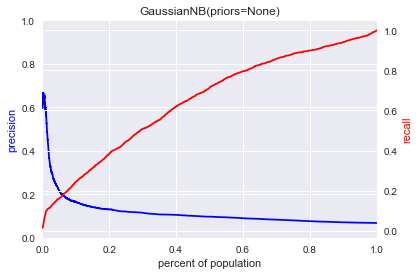

0.040474891662597656
GB


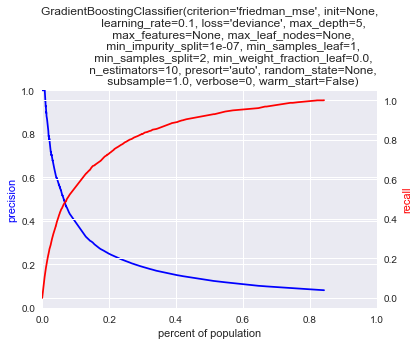

1.66510009765625


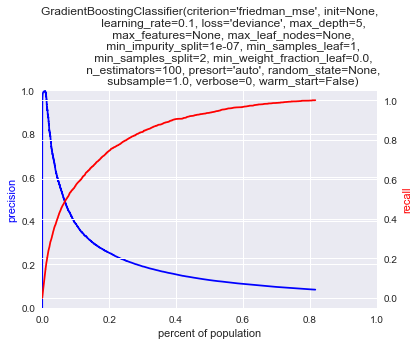

14.887500047683716


In [4]:
df = data
X = df[features]
y = df.serious_dlqin2yrs

#models_to_run=['RF','DT','KNN', 'SVM', 'AB', 'GB', 'LR', 'NB']
grid_size = "smaller"
models_to_run=['RF','DT','GB','LR', 'NB', 'GB']

def run_magicloop(grid_size, models_to_run, outfile='results.csv', JUPTYER=1):
    clfs, grid = magic.define_clfs_params(grid_size)
    results_df = magic.clf_loop(models_to_run, clfs,grid, X,y)
    results_df.to_csv(outfile, index=False)
    return results_df

results_df = run_magicloop(grid_size, models_to_run)

In [10]:
results_df

,model_type,clf,parameters,auc-roc,p_at_5,p_at_10,p_at_20,cnf,runtime
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.868082,0.548800,0.373067,0.245867,"[[34802, 151], [2045, 502]]",0.644746
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.870229,0.569600,0.381067,0.246800,"[[34844, 109], [2063, 484]]",5.075012
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.781366,0.529067,0.378933,0.244133,"[[34607, 346], [1837, 710]]",1.265795
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.848884,0.545067,0.363733,0.230800,"[[34646, 307], [1779, 768]]",10.701249
4,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.699723,0.759467,0.379733,0.256000,"[[34953, 0], [2547, 0]]",0.045804
5,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.043671
6,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.699723,0.759467,0.379733,0.256000,"[[34953, 0], [2547, 0]]",0.037546
7,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.036608
8,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.036532
9,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.028323


In [6]:
results_df.sort_values(by='auc-roc',ascending=False)

,model_type,clf,parameters,auc-roc,p_at_5,p_at_10,p_at_20,cnf,runtime
77,GB,([DecisionTreeRegressor(criterion='friedman_ms...,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.882031,0.574400,0.386133,0.252933,"[[34732, 221], [1813, 734]]",15.199776
83,GB,([DecisionTreeRegressor(criterion='friedman_ms...,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.882008,0.574400,0.385867,0.252933,"[[34732, 221], [1813, 734]]",14.887500
82,GB,([DecisionTreeRegressor(criterion='friedman_ms...,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.873045,0.566933,0.425600,0.249333,"[[34937, 16], [2212, 335]]",1.665100
76,GB,([DecisionTreeRegressor(criterion='friedman_ms...,"{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",0.873045,0.566933,0.425600,0.249333,"[[34937, 16], [2212, 335]]",1.644140
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.870229,0.569600,0.381067,0.246800,"[[34844, 109], [2063, 484]]",5.075012
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.868082,0.548800,0.373067,0.245867,"[[34802, 151], [2045, 502]]",0.644746
18,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.865309,0.568533,0.413333,0.244933,"[[34705, 248], [1841, 706]]",0.181338
17,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.862431,0.571733,0.409867,0.245467,"[[34693, 260], [1827, 720]]",0.195340
19,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.861964,0.557333,0.374933,0.247467,"[[34707, 246], [1858, 689]]",0.186253
57,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'entropy', 'max_depth': 10, 'max...",0.860982,0.566933,0.421333,0.249867,"[[34645, 308], [1812, 735]]",0.422406


model_type                                                   RF
clf           (DecisionTreeClassifier(class_weight=None, cri...
parameters    {'max_depth': 5, 'max_features': 'sqrt', 'min_...
auc-roc                                                0.868082
p_at_5                                                   0.5488
p_at_10                                                0.373067
p_at_20                                                0.245867
cnf                                 [[34802, 151], [2045, 502]]
runtime                                                0.644746
Name: 0, dtype: object
Confusion matrix, without normalization
[[34802   151]
 [ 2045   502]]
Normalized confusion matrix
[[ 1.   0. ]
 [ 0.8  0.2]]


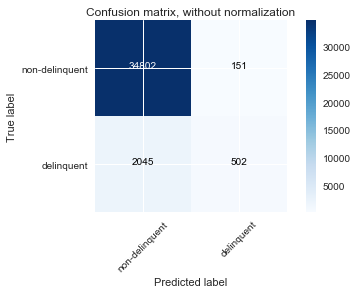

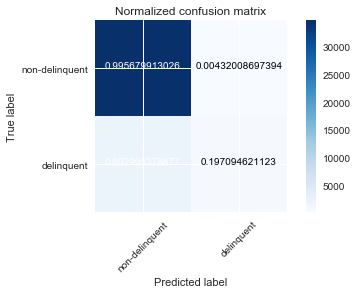

model_type                                                   RF
clf           (DecisionTreeClassifier(class_weight=None, cri...
parameters    {'max_depth': 5, 'max_features': 'sqrt', 'min_...
auc-roc                                                0.870229
p_at_5                                                   0.5696
p_at_10                                                0.381067
p_at_20                                                  0.2468
cnf                                 [[34844, 109], [2063, 484]]
runtime                                                 5.07501
Name: 1, dtype: object
Confusion matrix, without normalization
[[34844   109]
 [ 2063   484]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.81  0.19]]


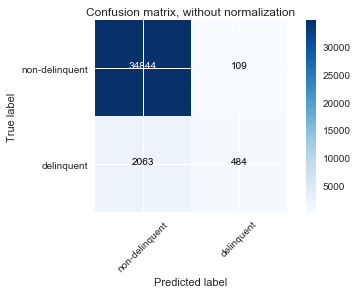

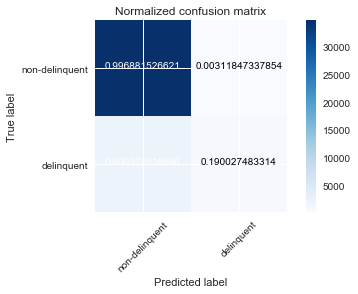

model_type                                                   RF
clf           (DecisionTreeClassifier(class_weight=None, cri...
parameters    {'max_depth': 50, 'max_features': 'sqrt', 'min...
auc-roc                                                0.781366
p_at_5                                                 0.529067
p_at_10                                                0.378933
p_at_20                                                0.244133
cnf                                 [[34607, 346], [1837, 710]]
runtime                                                 1.26579
Name: 2, dtype: object
Confusion matrix, without normalization
[[34607   346]
 [ 1837   710]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.72  0.28]]


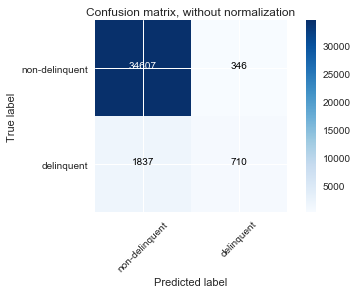

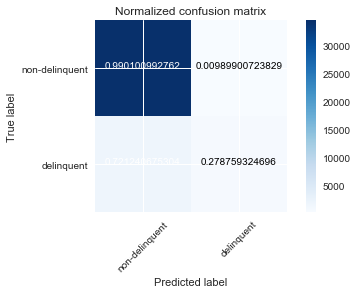

model_type                                                   RF
clf           (DecisionTreeClassifier(class_weight=None, cri...
parameters    {'max_depth': 50, 'max_features': 'sqrt', 'min...
auc-roc                                                0.848884
p_at_5                                                 0.545067
p_at_10                                                0.363733
p_at_20                                                  0.2308
cnf                                 [[34646, 307], [1779, 768]]
runtime                                                 10.7012
Name: 3, dtype: object
Confusion matrix, without normalization
[[34646   307]
 [ 1779   768]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.7   0.3 ]]


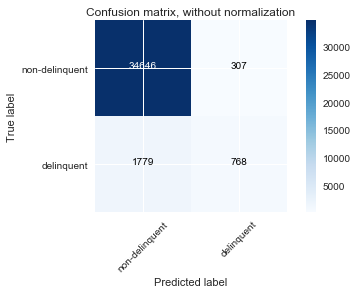

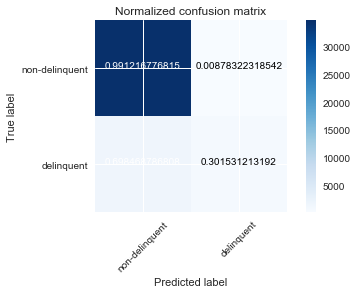

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.699723
p_at_5                                                 0.759467
p_at_10                                                0.379733
p_at_20                                                   0.256
cnf                                     [[34953, 0], [2547, 0]]
runtime                                                0.045804
Name: 4, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


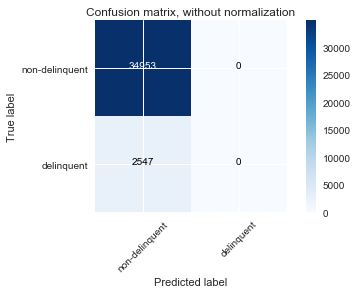

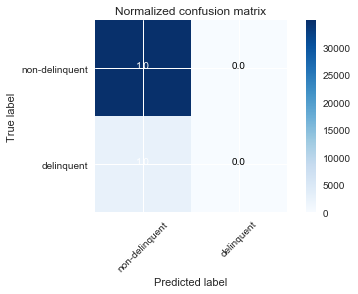

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0436711
Name: 5, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


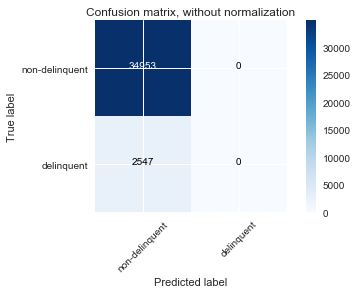

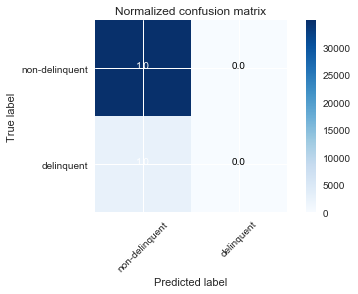

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.699723
p_at_5                                                 0.759467
p_at_10                                                0.379733
p_at_20                                                   0.256
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0375459
Name: 6, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


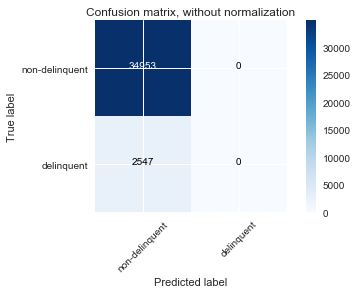

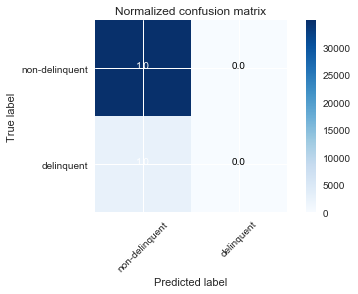

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                                0.036608
Name: 7, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


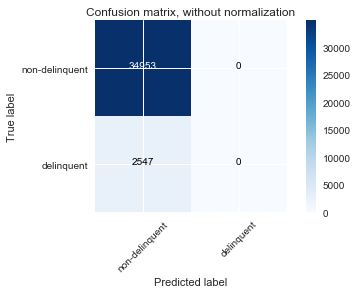

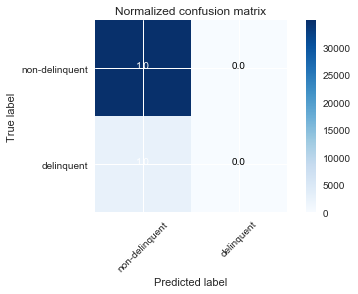

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0365319
Name: 8, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


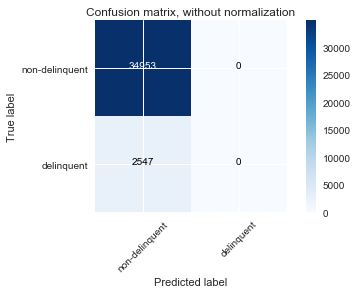

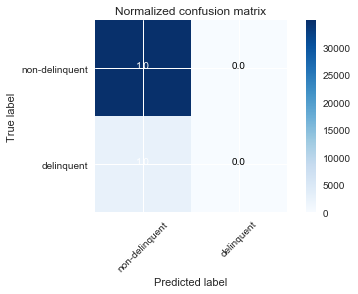

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 1, 'max_fea...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0283227
Name: 9, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


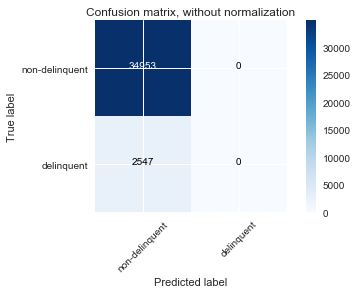

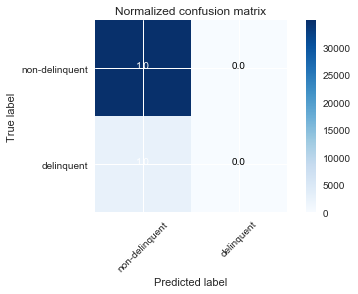

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.835843
p_at_5                                                   0.4944
p_at_10                                                0.353333
p_at_20                                                0.233467
cnf                                 [[34742, 211], [2181, 366]]
runtime                                                0.110754
Name: 10, dtype: object
Confusion matrix, without normalization
[[34742   211]
 [ 2181   366]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.86  0.14]]


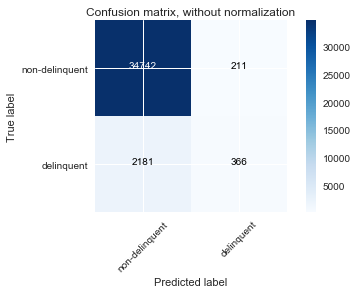

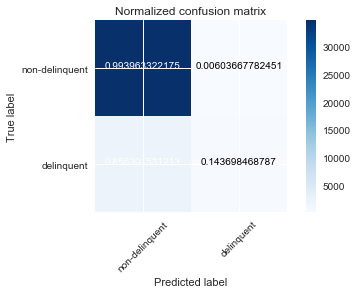

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.833605
p_at_5                                                 0.512533
p_at_10                                                  0.3528
p_at_20                                                0.234133
cnf                                  [[34864, 89], [2176, 371]]
runtime                                                0.122034
Name: 11, dtype: object
Confusion matrix, without normalization
[[34864    89]
 [ 2176   371]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.85  0.15]]


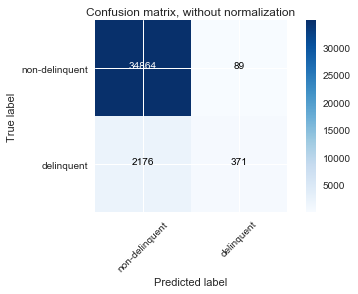

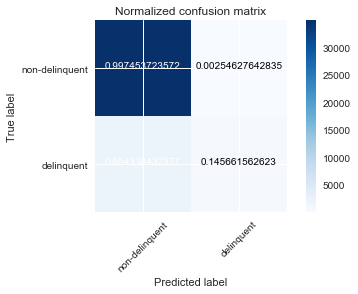

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.835482
p_at_5                                                   0.4944
p_at_10                                                0.357067
p_at_20                                                0.236667
cnf                                 [[34677, 276], [2058, 489]]
runtime                                                0.101844
Name: 12, dtype: object
Confusion matrix, without normalization
[[34677   276]
 [ 2058   489]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.81  0.19]]


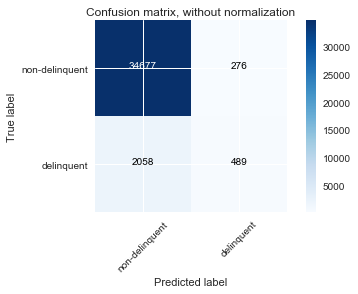

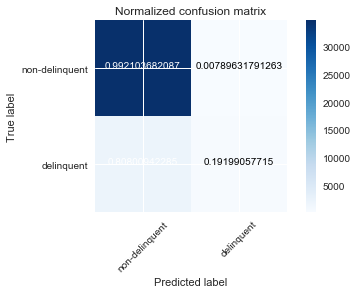

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.835119
p_at_5                                                   0.4976
p_at_10                                                0.357333
p_at_20                                                0.250133
cnf                                 [[34809, 144], [2216, 331]]
runtime                                                0.113713
Name: 13, dtype: object
Confusion matrix, without normalization
[[34809   144]
 [ 2216   331]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.87  0.13]]


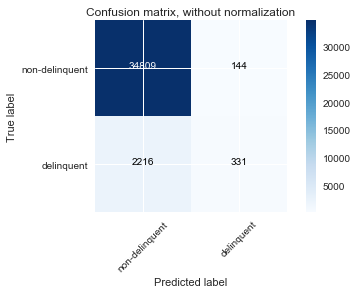

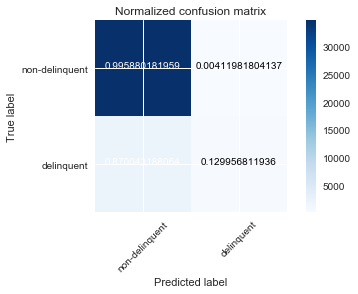

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.843004
p_at_5                                                 0.549333
p_at_10                                                0.345333
p_at_20                                                  0.2544
cnf                                 [[34616, 337], [2025, 522]]
runtime                                                0.107178
Name: 14, dtype: object
Confusion matrix, without normalization
[[34616   337]
 [ 2025   522]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.8   0.2 ]]


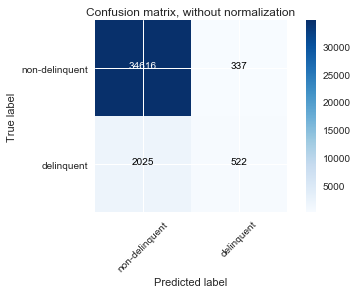

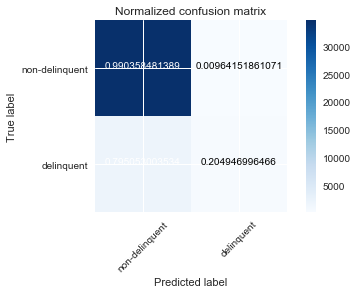

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 5, 'max_fea...
auc-roc                                                0.837999
p_at_5                                                 0.485867
p_at_10                                                0.374133
p_at_20                                                0.236667
cnf                                 [[34745, 208], [2114, 433]]
runtime                                                0.123204
Name: 15, dtype: object
Confusion matrix, without normalization
[[34745   208]
 [ 2114   433]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.83  0.17]]


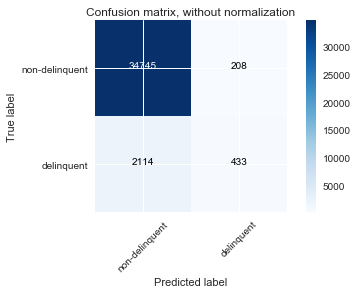

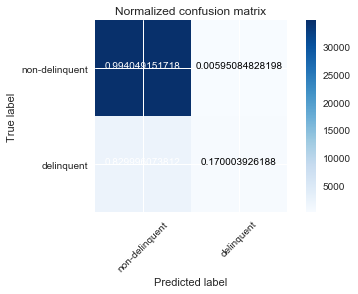

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.851947
p_at_5                                                 0.552533
p_at_10                                                0.372533
p_at_20                                                0.246533
cnf                                 [[34637, 316], [1863, 684]]
runtime                                                0.183403
Name: 16, dtype: object
Confusion matrix, without normalization
[[34637   316]
 [ 1863   684]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


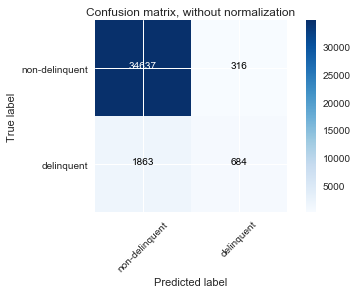

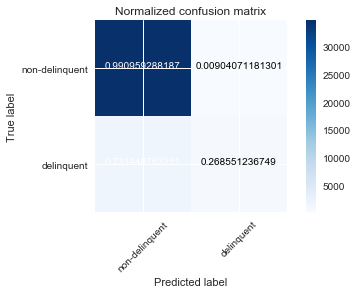

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.862431
p_at_5                                                 0.571733
p_at_10                                                0.409867
p_at_20                                                0.245467
cnf                                 [[34693, 260], [1827, 720]]
runtime                                                 0.19534
Name: 17, dtype: object
Confusion matrix, without normalization
[[34693   260]
 [ 1827   720]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.72  0.28]]


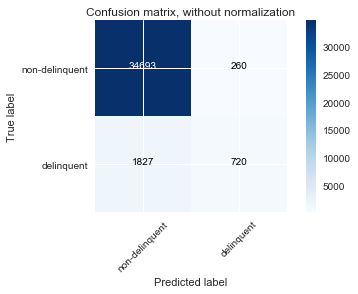

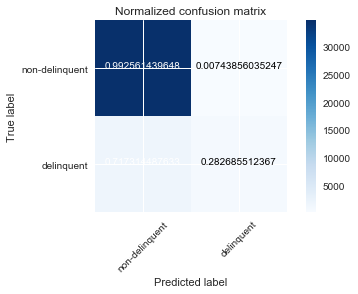

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.865309
p_at_5                                                 0.568533
p_at_10                                                0.413333
p_at_20                                                0.244933
cnf                                 [[34705, 248], [1841, 706]]
runtime                                                0.181338
Name: 18, dtype: object
Confusion matrix, without normalization
[[34705   248]
 [ 1841   706]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.72  0.28]]


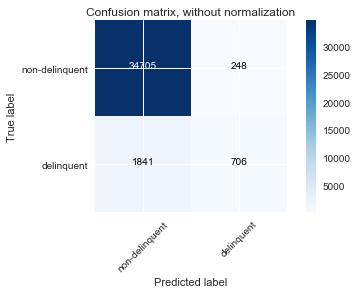

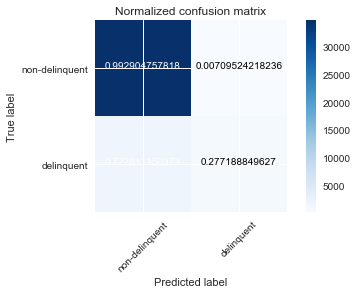

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.861964
p_at_5                                                 0.557333
p_at_10                                                0.374933
p_at_20                                                0.247467
cnf                                 [[34707, 246], [1858, 689]]
runtime                                                0.186253
Name: 19, dtype: object
Confusion matrix, without normalization
[[34707   246]
 [ 1858   689]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


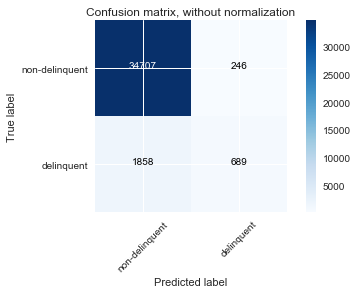

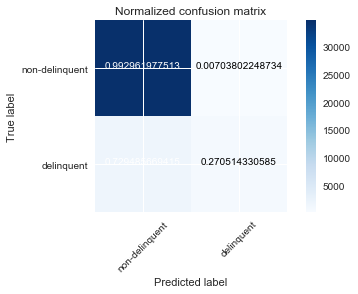

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.850769
p_at_5                                                   0.5424
p_at_10                                                0.404267
p_at_20                                                0.245333
cnf                                 [[34575, 378], [1776, 771]]
runtime                                                0.173118
Name: 20, dtype: object
Confusion matrix, without normalization
[[34575   378]
 [ 1776   771]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.7   0.3 ]]


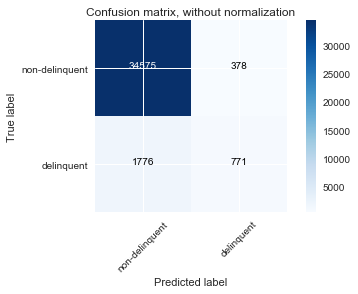

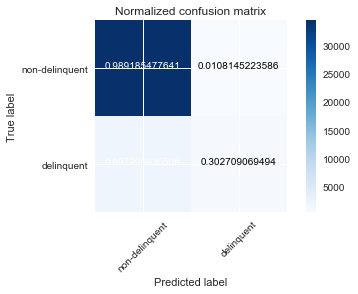

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 10, 'max_fe...
auc-roc                                                0.838811
p_at_5                                                 0.515733
p_at_10                                                  0.3944
p_at_20                                                0.237467
cnf                                 [[34625, 328], [1917, 630]]
runtime                                                 0.18506
Name: 21, dtype: object
Confusion matrix, without normalization
[[34625   328]
 [ 1917   630]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.75  0.25]]


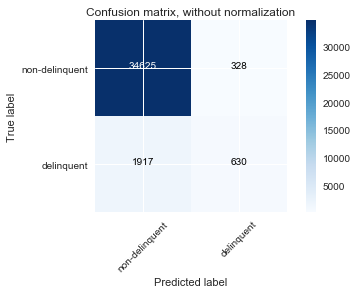

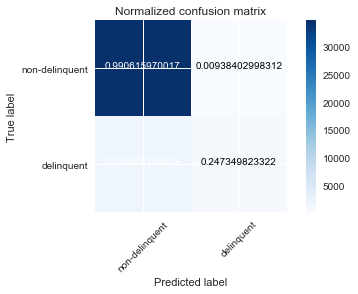

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                  0.7245
p_at_5                                                 0.446933
p_at_10                                                   0.312
p_at_20                                                  0.1996
cnf                                 [[33995, 958], [1740, 807]]
runtime                                                0.292736
Name: 22, dtype: object
Confusion matrix, without normalization
[[33995   958]
 [ 1740   807]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.68  0.32]]


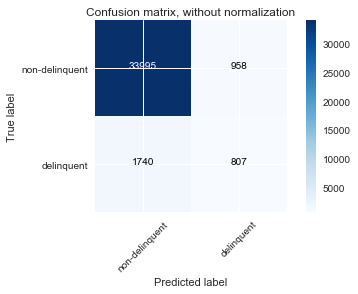

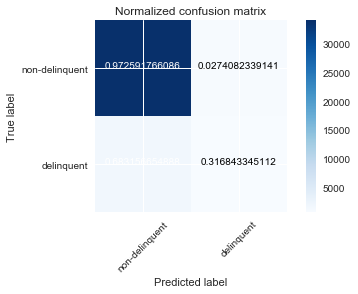

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                0.742041
p_at_5                                                   0.4736
p_at_10                                                  0.3248
p_at_20                                                0.207867
cnf                                 [[34085, 868], [1735, 812]]
runtime                                                0.292065
Name: 23, dtype: object
Confusion matrix, without normalization
[[34085   868]
 [ 1735   812]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.68  0.32]]


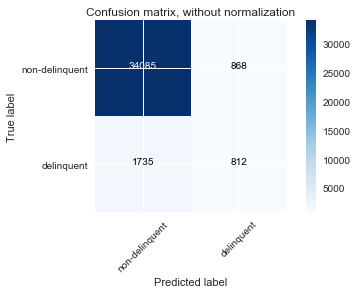

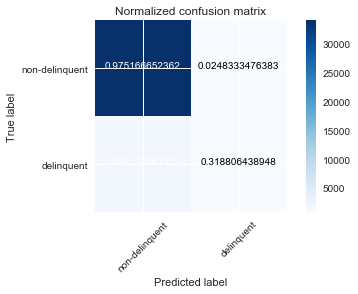

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                0.743391
p_at_5                                                   0.4512
p_at_10                                                0.315467
p_at_20                                                0.209867
cnf                                 [[34133, 820], [1753, 794]]
runtime                                                 0.30284
Name: 24, dtype: object
Confusion matrix, without normalization
[[34133   820]
 [ 1753   794]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.69  0.31]]


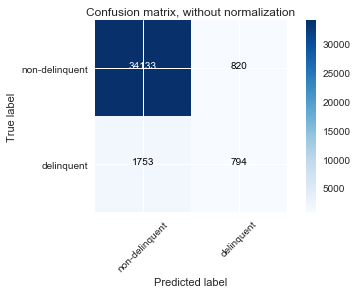

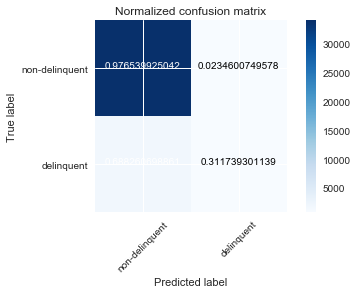

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                0.706338
p_at_5                                                   0.4448
p_at_10                                                   0.296
p_at_20                                                0.190133
cnf                                 [[33963, 990], [1721, 826]]
runtime                                                0.319233
Name: 25, dtype: object
Confusion matrix, without normalization
[[33963   990]
 [ 1721   826]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.68  0.32]]


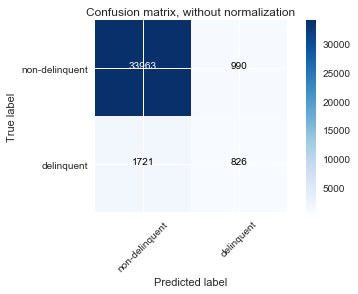

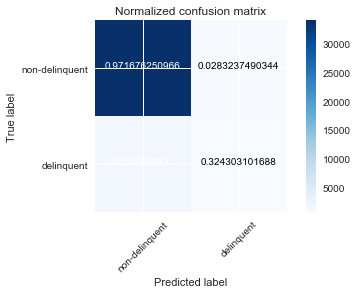

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                0.728797
p_at_5                                                   0.4608
p_at_10                                                0.314933
p_at_20                                                0.200933
cnf                                 [[34070, 883], [1734, 813]]
runtime                                                0.292067
Name: 26, dtype: object
Confusion matrix, without normalization
[[34070   883]
 [ 1734   813]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.68  0.32]]


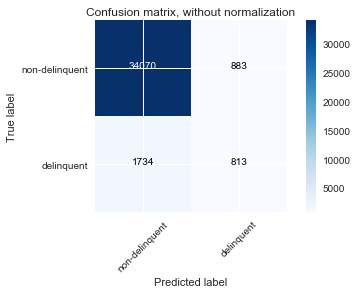

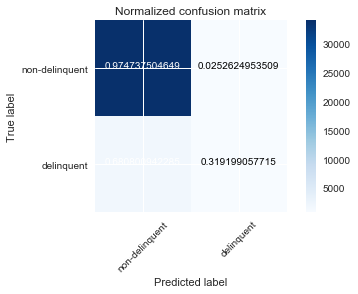

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 20, 'max_fe...
auc-roc                                                0.738517
p_at_5                                                 0.468267
p_at_10                                                0.318933
p_at_20                                                0.206133
cnf                                 [[34100, 853], [1721, 826]]
runtime                                                0.298124
Name: 27, dtype: object
Confusion matrix, without normalization
[[34100   853]
 [ 1721   826]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.68  0.32]]


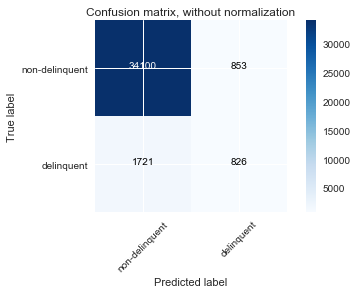

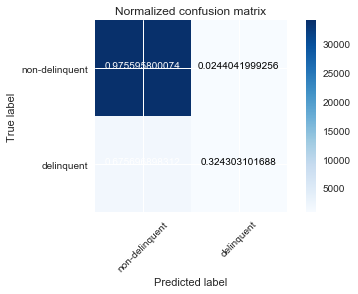

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                0.655236
p_at_5                                                 0.482667
p_at_10                                                  0.5784
p_at_20                                                  0.3396
cnf                                [[33373, 1580], [1642, 905]]
runtime                                                0.366804
Name: 28, dtype: object
Confusion matrix, without normalization
[[33373  1580]
 [ 1642   905]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.64  0.36]]


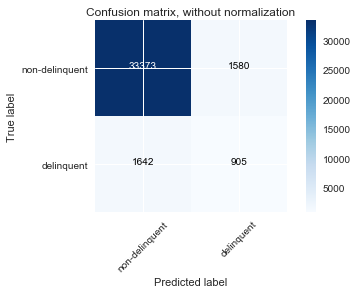

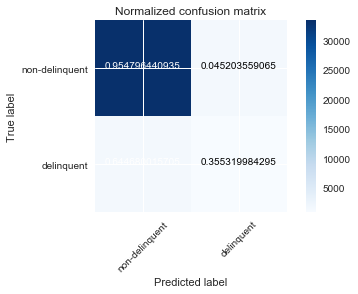

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                0.673715
p_at_5                                                   0.4336
p_at_10                                                0.297867
p_at_20                                                  0.3396
cnf                                [[33637, 1316], [1688, 859]]
runtime                                                0.312264
Name: 29, dtype: object
Confusion matrix, without normalization
[[33637  1316]
 [ 1688   859]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.66  0.34]]


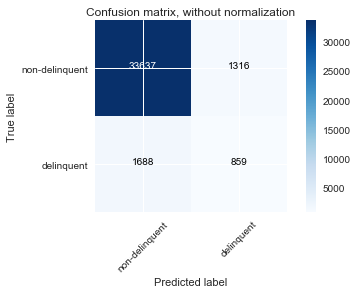

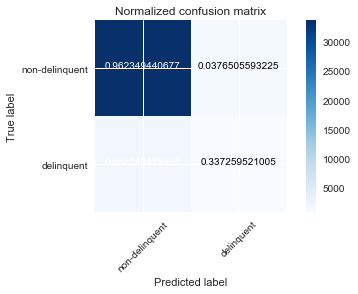

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                 0.70899
p_at_5                                                   0.4416
p_at_10                                                0.304533
p_at_20                                                  0.3396
cnf                                [[33860, 1093], [1707, 840]]
runtime                                                0.299494
Name: 30, dtype: object
Confusion matrix, without normalization
[[33860  1093]
 [ 1707   840]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.67  0.33]]


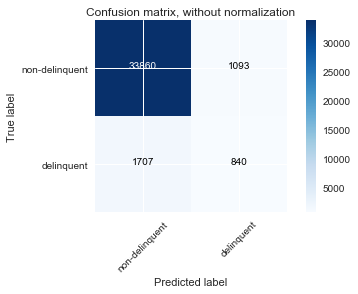

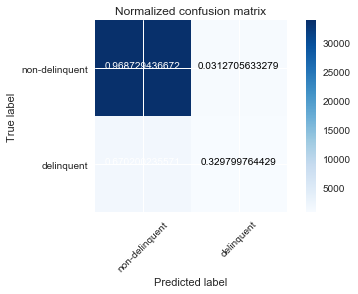

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                0.652278
p_at_5                                                 0.477333
p_at_10                                                0.556267
p_at_20                                                  0.3396
cnf                                [[33291, 1662], [1652, 895]]
runtime                                                0.334094
Name: 31, dtype: object
Confusion matrix, without normalization
[[33291  1662]
 [ 1652   895]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.65  0.35]]


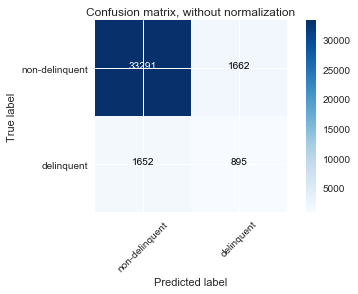

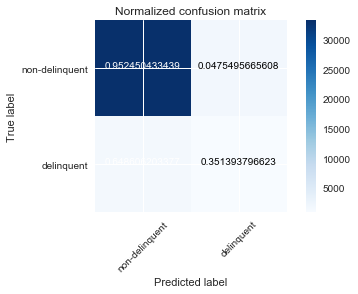

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                0.677431
p_at_5                                                     0.44
p_at_10                                                0.354133
p_at_20                                                  0.3396
cnf                                [[33576, 1377], [1676, 871]]
runtime                                                0.293629
Name: 32, dtype: object
Confusion matrix, without normalization
[[33576  1377]
 [ 1676   871]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.66  0.34]]


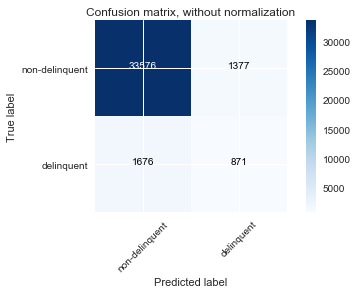

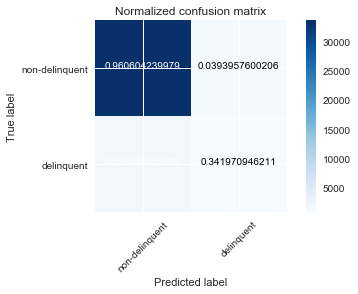

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 50, 'max_fe...
auc-roc                                                0.702695
p_at_5                                                 0.432533
p_at_10                                                  0.2952
p_at_20                                                  0.3396
cnf                                [[33889, 1064], [1752, 795]]
runtime                                                0.275497
Name: 33, dtype: object
Confusion matrix, without normalization
[[33889  1064]
 [ 1752   795]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.69  0.31]]


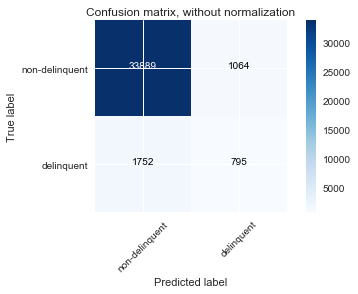

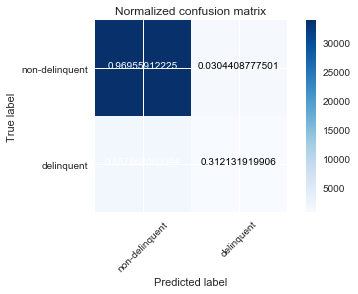

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                0.657037
p_at_5                                                   0.4912
p_at_10                                                0.553333
p_at_20                                                  0.3396
cnf                                [[33280, 1673], [1626, 921]]
runtime                                                0.328238
Name: 34, dtype: object
Confusion matrix, without normalization
[[33280  1673]
 [ 1626   921]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.64  0.36]]


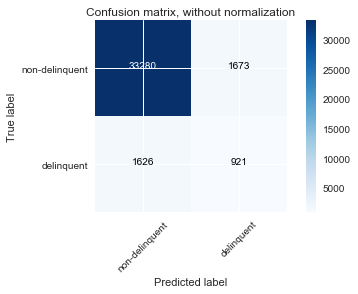

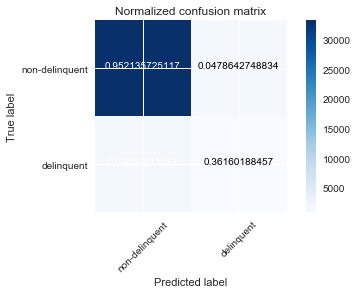

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                0.673352
p_at_5                                                 0.430933
p_at_10                                                0.322933
p_at_20                                                  0.3396
cnf                                [[33574, 1379], [1692, 855]]
runtime                                                 0.32576
Name: 35, dtype: object
Confusion matrix, without normalization
[[33574  1379]
 [ 1692   855]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.66  0.34]]


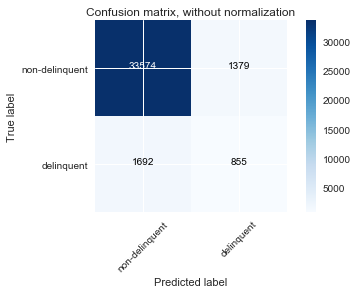

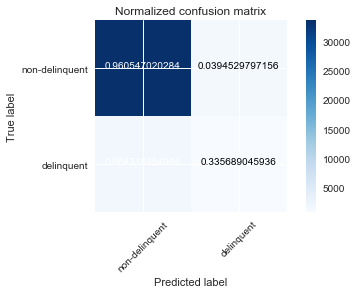

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                0.702903
p_at_5                                                 0.426667
p_at_10                                                0.295467
p_at_20                                                  0.3396
cnf                                [[33787, 1166], [1711, 836]]
runtime                                                 0.33468
Name: 36, dtype: object
Confusion matrix, without normalization
[[33787  1166]
 [ 1711   836]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.67  0.33]]


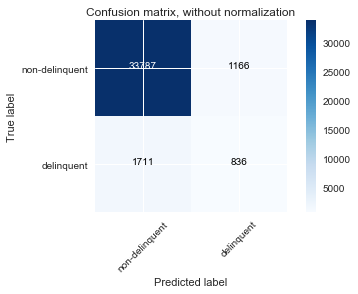

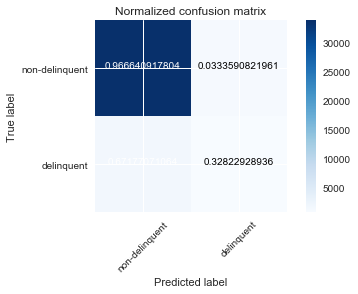

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                0.650935
p_at_5                                                 0.471467
p_at_10                                                  0.5712
p_at_20                                                  0.3396
cnf                                [[33350, 1603], [1663, 884]]
runtime                                                0.434677
Name: 37, dtype: object
Confusion matrix, without normalization
[[33350  1603]
 [ 1663   884]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.65  0.35]]


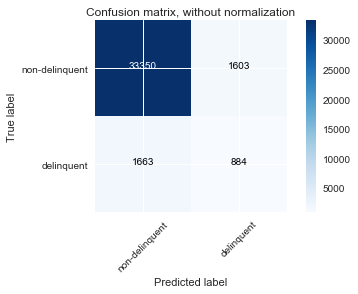

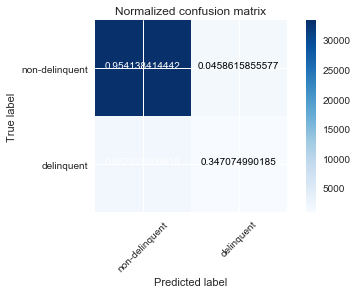

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                0.674024
p_at_5                                                 0.418133
p_at_10                                                  0.3176
p_at_20                                                  0.3396
cnf                                [[33552, 1401], [1713, 834]]
runtime                                                  0.4944
Name: 38, dtype: object
Confusion matrix, without normalization
[[33552  1401]
 [ 1713   834]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.67  0.33]]


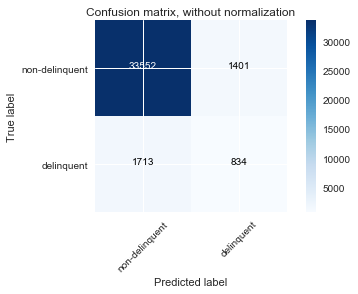

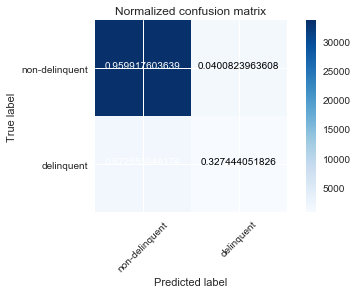

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'gini', 'max_depth': 100, 'max_f...
auc-roc                                                 0.70423
p_at_5                                                 0.436267
p_at_10                                                0.301333
p_at_20                                                  0.3396
cnf                                [[33841, 1112], [1707, 840]]
runtime                                                0.366146
Name: 39, dtype: object
Confusion matrix, without normalization
[[33841  1112]
 [ 1707   840]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.67  0.33]]


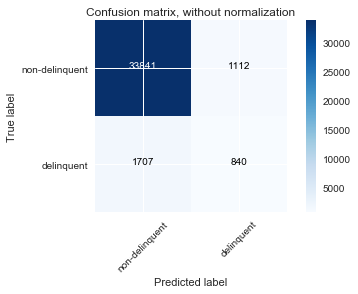

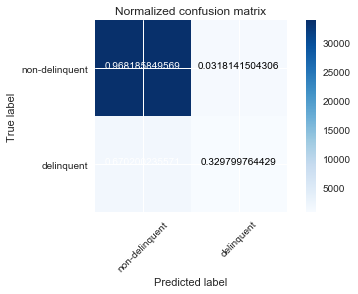

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.648561
p_at_5                                                        1
p_at_10                                                  0.5392
p_at_20                                                  0.2696
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0636489
Name: 40, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


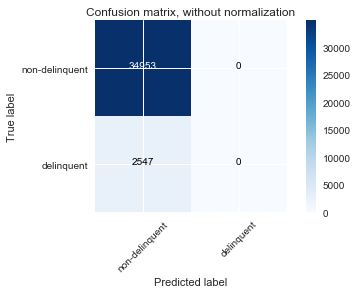

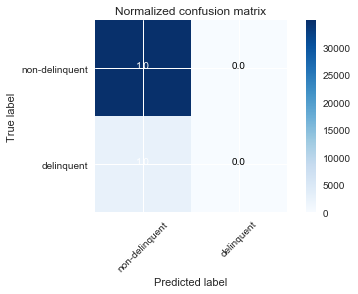

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.603952
p_at_5                                                        1
p_at_10                                                0.529067
p_at_20                                                0.264533
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0533471
Name: 41, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


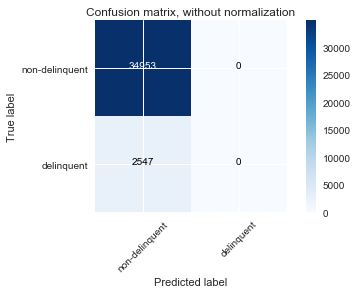

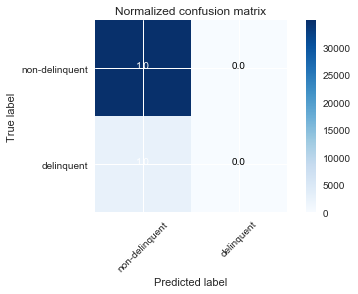

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.726654
p_at_5                                                 0.950933
p_at_10                                                0.475467
p_at_20                                                0.237733
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0651348
Name: 42, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


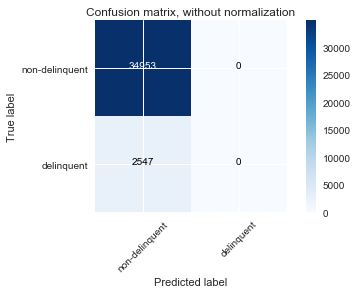

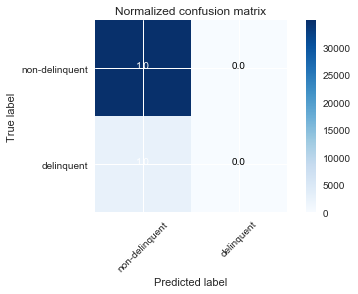

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0953779
Name: 43, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


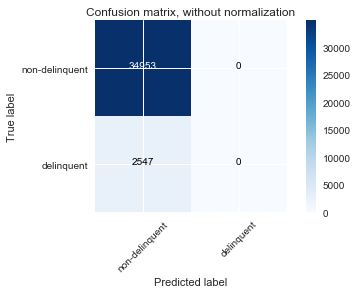

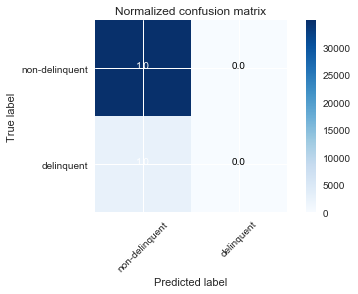

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.603952
p_at_5                                                        1
p_at_10                                                0.529067
p_at_20                                                0.264533
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0862169
Name: 44, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


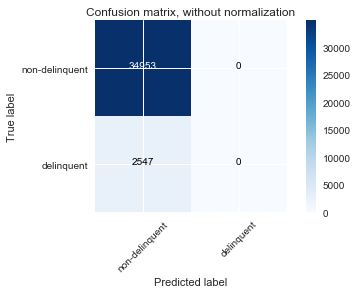

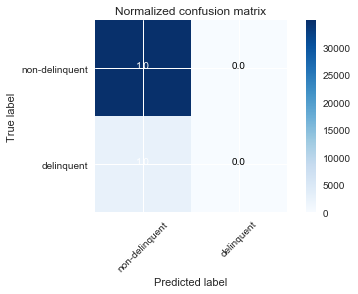

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 1, 'max_...
auc-roc                                                0.653223
p_at_5                                                    0.464
p_at_10                                                0.672533
p_at_20                                                  0.3396
cnf                                     [[34953, 0], [2547, 0]]
runtime                                               0.0414379
Name: 45, dtype: object
Confusion matrix, without normalization
[[34953     0]
 [ 2547     0]]
Normalized confusion matrix
[[ 1.  0.]
 [ 1.  0.]]


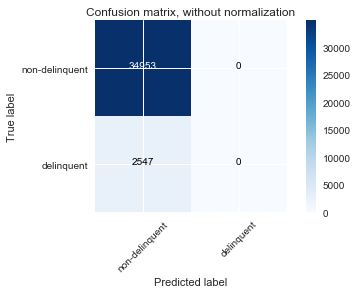

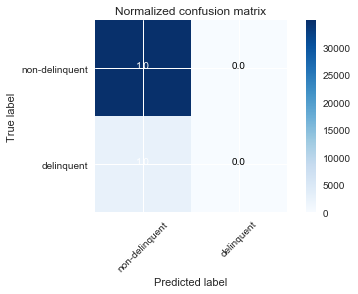

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                0.816642
p_at_5                                                   0.5088
p_at_10                                                0.410667
p_at_20                                                0.224667
cnf                                 [[34843, 110], [2297, 250]]
runtime                                                0.216091
Name: 46, dtype: object
Confusion matrix, without normalization
[[34843   110]
 [ 2297   250]]
Normalized confusion matrix
[[ 1.   0. ]
 [ 0.9  0.1]]


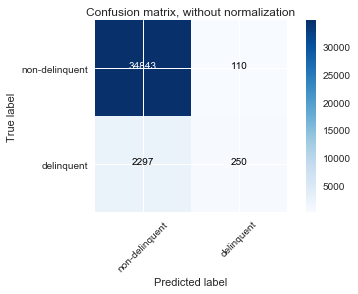

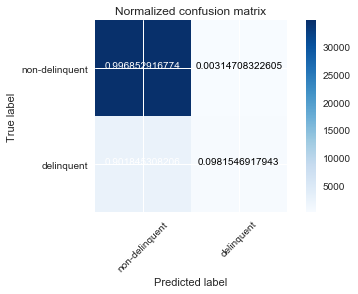

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                0.845397
p_at_5                                                    0.496
p_at_10                                                0.455467
p_at_20                                                0.254133
cnf                                 [[34745, 208], [2144, 403]]
runtime                                                0.225328
Name: 47, dtype: object
Confusion matrix, without normalization
[[34745   208]
 [ 2144   403]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.84  0.16]]


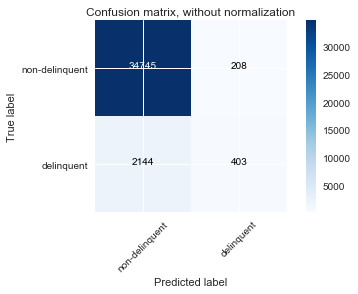

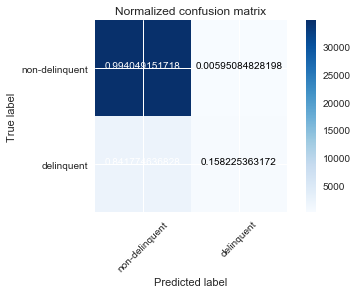

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                0.809029
p_at_5                                                 0.515733
p_at_10                                                  0.3264
p_at_20                                                  0.2048
cnf                                 [[34784, 169], [2152, 395]]
runtime                                                0.129503
Name: 48, dtype: object
Confusion matrix, without normalization
[[34784   169]
 [ 2152   395]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.84  0.16]]


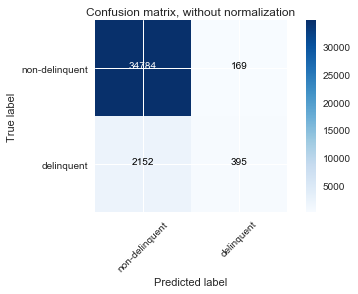

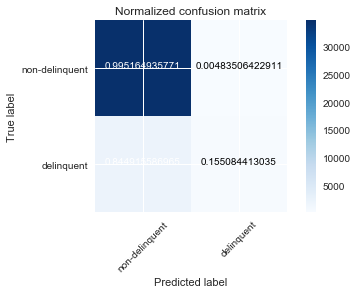

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                0.848227
p_at_5                                                 0.447467
p_at_10                                                0.374133
p_at_20                                                  0.2364
cnf                                  [[34909, 44], [2245, 302]]
runtime                                                0.307093
Name: 49, dtype: object
Confusion matrix, without normalization
[[34909    44]
 [ 2245   302]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.88  0.12]]


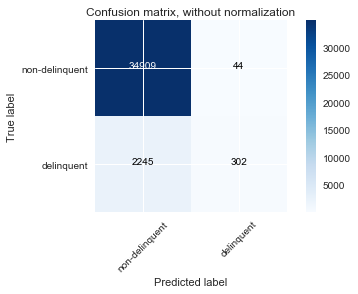

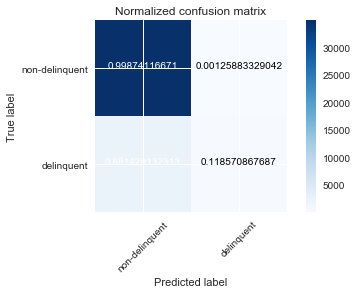

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                 0.84112
p_at_5                                                   0.4416
p_at_10                                                0.402133
p_at_20                                                0.244933
cnf                                 [[34804, 149], [2251, 296]]
runtime                                                0.219658
Name: 50, dtype: object
Confusion matrix, without normalization
[[34804   149]
 [ 2251   296]]
Normalized confusion matrix
[[ 1.    0.  ]
 [ 0.88  0.12]]


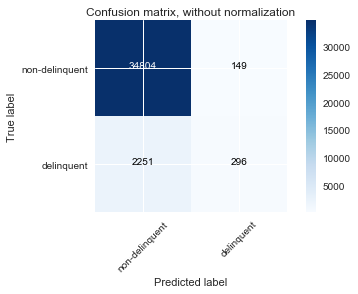

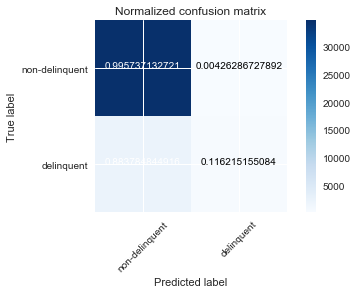

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 5, 'max_...
auc-roc                                                 0.84891
p_at_5                                                   0.4272
p_at_10                                                0.359467
p_at_20                                                0.258533
cnf                                 [[34680, 273], [2163, 384]]
runtime                                                0.175061
Name: 51, dtype: object
Confusion matrix, without normalization
[[34680   273]
 [ 2163   384]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.85  0.15]]


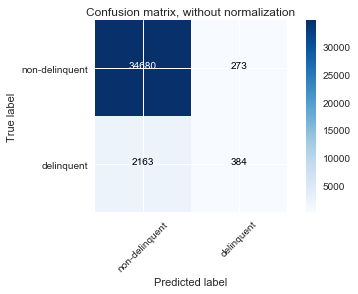

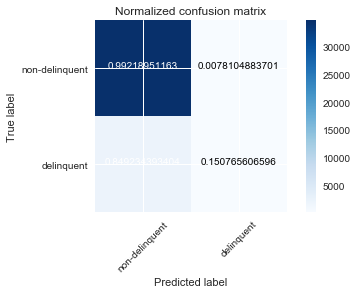

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.853776
p_at_5                                                   0.5776
p_at_10                                                0.414933
p_at_20                                                0.251333
cnf                                 [[34682, 271], [1851, 696]]
runtime                                                 0.28122
Name: 52, dtype: object
Confusion matrix, without normalization
[[34682   271]
 [ 1851   696]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


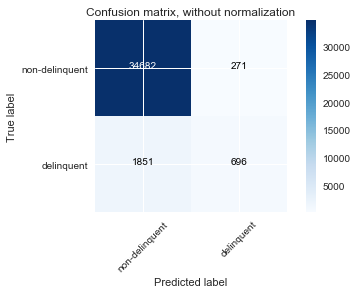

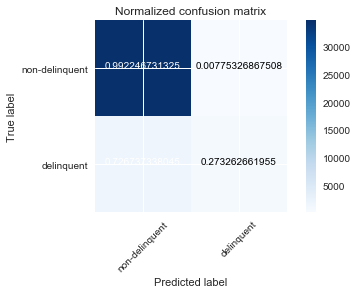

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.853536
p_at_5                                                    0.552
p_at_10                                                0.374133
p_at_20                                                  0.2444
cnf                                 [[34668, 285], [1867, 680]]
runtime                                                0.285683
Name: 53, dtype: object
Confusion matrix, without normalization
[[34668   285]
 [ 1867   680]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


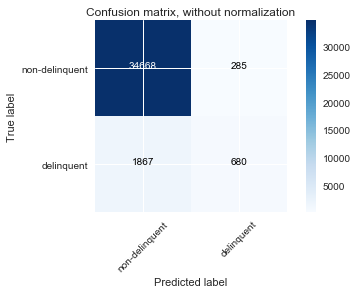

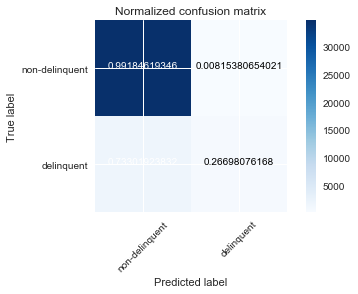

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.859343
p_at_5                                                   0.5552
p_at_10                                                  0.3624
p_at_20                                                   0.246
cnf                                 [[34714, 239], [1861, 686]]
runtime                                                0.346857
Name: 54, dtype: object
Confusion matrix, without normalization
[[34714   239]
 [ 1861   686]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


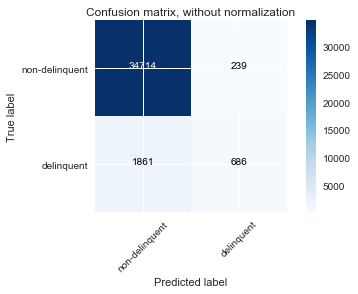

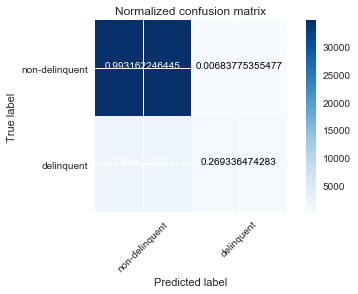

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.847864
p_at_5                                                 0.548267
p_at_10                                                    0.36
p_at_20                                                0.250133
cnf                                 [[34722, 231], [1892, 655]]
runtime                                                0.239684
Name: 55, dtype: object
Confusion matrix, without normalization
[[34722   231]
 [ 1892   655]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.74  0.26]]


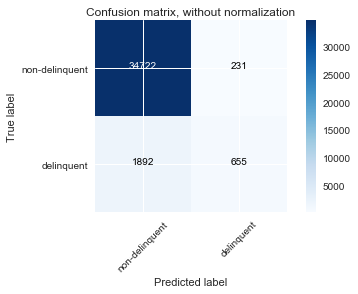

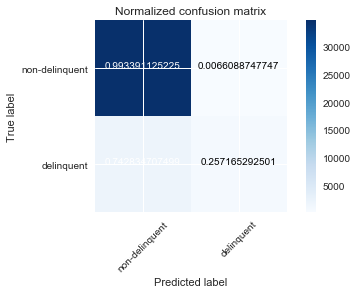

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.853183
p_at_5                                                    0.552
p_at_10                                                0.386933
p_at_20                                                  0.2444
cnf                                 [[34673, 280], [1868, 679]]
runtime                                                0.385297
Name: 56, dtype: object
Confusion matrix, without normalization
[[34673   280]
 [ 1868   679]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.73  0.27]]


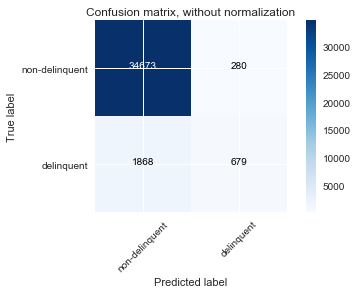

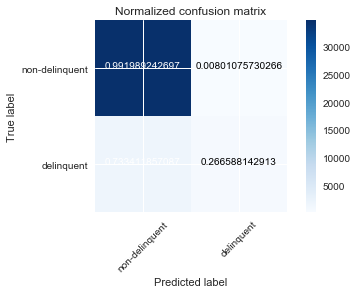

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 10, 'max...
auc-roc                                                0.860982
p_at_5                                                 0.566933
p_at_10                                                0.421333
p_at_20                                                0.249867
cnf                                 [[34645, 308], [1812, 735]]
runtime                                                0.422406
Name: 57, dtype: object
Confusion matrix, without normalization
[[34645   308]
 [ 1812   735]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.71  0.29]]


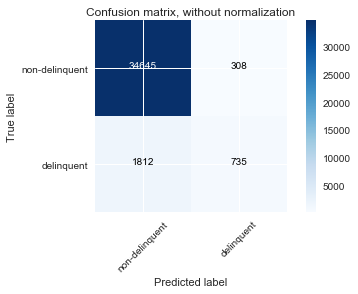

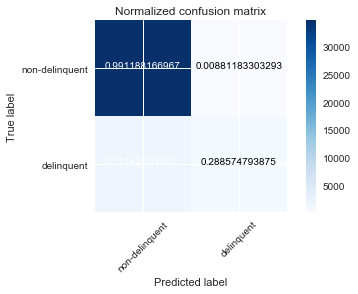

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.721179
p_at_5                                                 0.470933
p_at_10                                                    0.32
p_at_20                                                0.202267
cnf                                 [[34118, 835], [1729, 818]]
runtime                                                0.719236
Name: 58, dtype: object
Confusion matrix, without normalization
[[34118   835]
 [ 1729   818]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.68  0.32]]


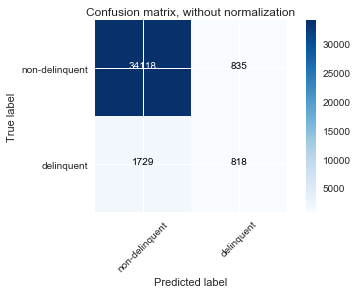

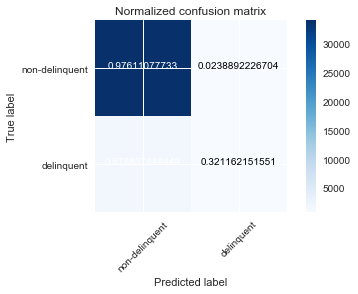

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.723936
p_at_5                                                 0.449067
p_at_10                                                  0.3144
p_at_20                                                0.199867
cnf                                 [[34020, 933], [1744, 803]]
runtime                                                0.573217
Name: 59, dtype: object
Confusion matrix, without normalization
[[34020   933]
 [ 1744   803]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.68  0.32]]


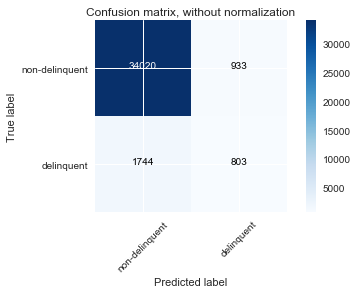

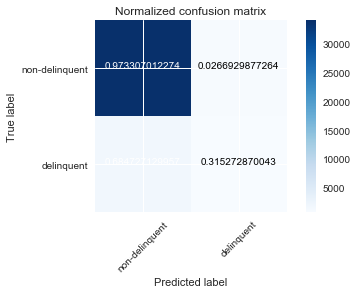

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.771176
p_at_5                                                 0.479467
p_at_10                                                   0.336
p_at_20                                                0.217333
cnf                                 [[34211, 742], [1750, 797]]
runtime                                                0.567923
Name: 60, dtype: object
Confusion matrix, without normalization
[[34211   742]
 [ 1750   797]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.69  0.31]]


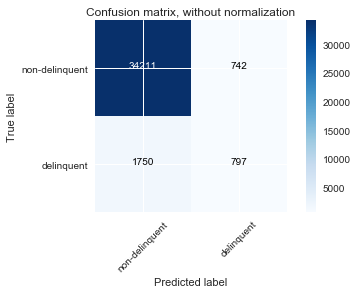

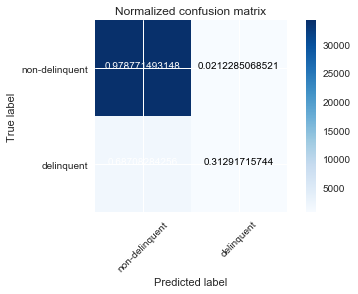

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.725934
p_at_5                                                 0.465067
p_at_10                                                  0.3176
p_at_20                                                0.201733
cnf                                 [[34075, 878], [1753, 794]]
runtime                                                0.577305
Name: 61, dtype: object
Confusion matrix, without normalization
[[34075   878]
 [ 1753   794]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.69  0.31]]


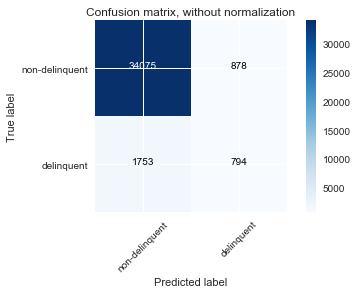

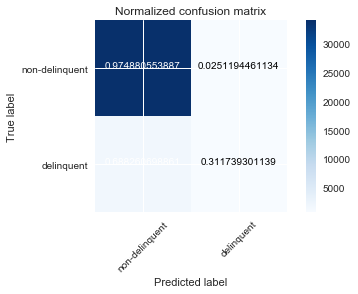

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.742293
p_at_5                                                 0.451733
p_at_10                                                  0.3256
p_at_20                                                  0.2068
cnf                                 [[34164, 789], [1757, 790]]
runtime                                                0.586977
Name: 62, dtype: object
Confusion matrix, without normalization
[[34164   789]
 [ 1757   790]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.69  0.31]]


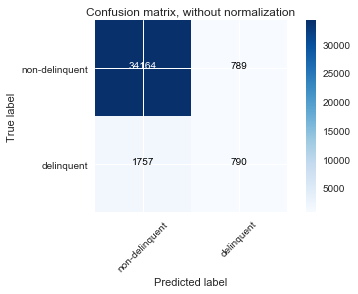

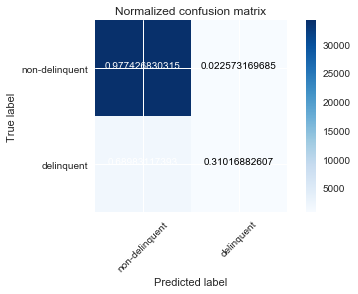

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 20, 'max...
auc-roc                                                0.758762
p_at_5                                                 0.461867
p_at_10                                                0.334933
p_at_20                                                0.215467
cnf                                 [[34204, 749], [1751, 796]]
runtime                                                  0.6182
Name: 63, dtype: object
Confusion matrix, without normalization
[[34204   749]
 [ 1751   796]]
Normalized confusion matrix
[[ 0.98  0.02]
 [ 0.69  0.31]]


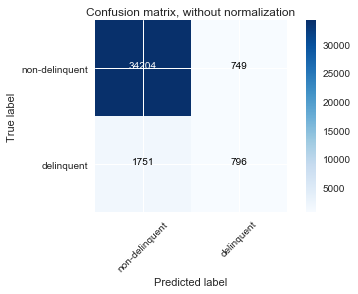

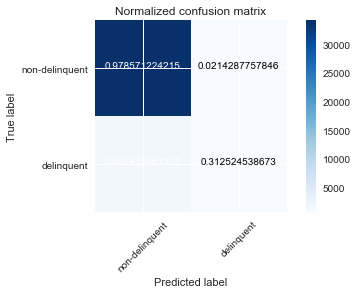

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.655532
p_at_5                                                 0.487467
p_at_10                                                0.515733
p_at_20                                                  0.3396
cnf                                [[33360, 1593], [1633, 914]]
runtime                                                0.729327
Name: 64, dtype: object
Confusion matrix, without normalization
[[33360  1593]
 [ 1633   914]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.64  0.36]]


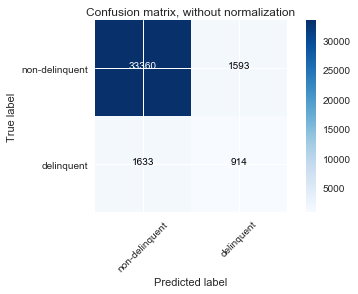

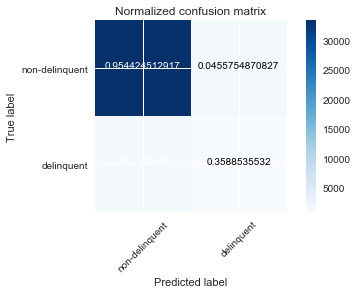

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.674853
p_at_5                                                 0.443733
p_at_10                                                0.375733
p_at_20                                                  0.3396
cnf                                [[33566, 1387], [1676, 871]]
runtime                                                0.621944
Name: 65, dtype: object
Confusion matrix, without normalization
[[33566  1387]
 [ 1676   871]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.66  0.34]]


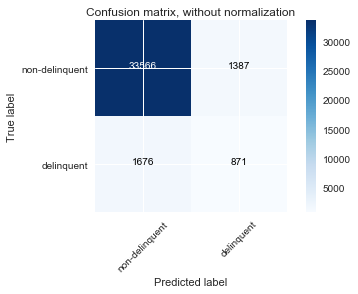

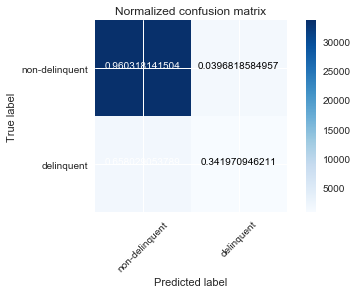

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.701762
p_at_5                                                 0.444267
p_at_10                                                0.298133
p_at_20                                                  0.3396
cnf                                [[33808, 1145], [1690, 857]]
runtime                                                0.665723
Name: 66, dtype: object
Confusion matrix, without normalization
[[33808  1145]
 [ 1690   857]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.66  0.34]]


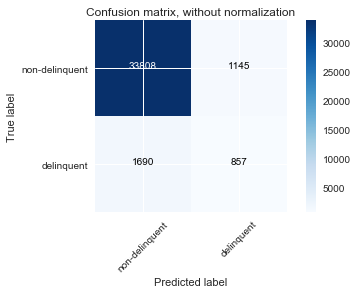

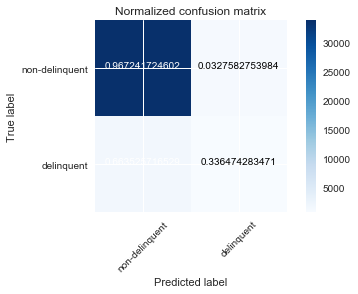

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.653005
p_at_5                                                 0.480533
p_at_10                                                  0.5312
p_at_20                                                  0.3396
cnf                                [[33263, 1690], [1646, 901]]
runtime                                                0.748485
Name: 67, dtype: object
Confusion matrix, without normalization
[[33263  1690]
 [ 1646   901]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.65  0.35]]


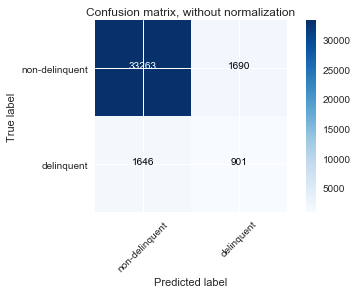

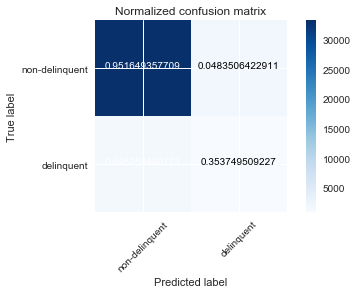

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.668086
p_at_5                                                 0.405333
p_at_10                                                   0.368
p_at_20                                                  0.3396
cnf                                [[33455, 1498], [1704, 843]]
runtime                                                0.547802
Name: 68, dtype: object
Confusion matrix, without normalization
[[33455  1498]
 [ 1704   843]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.67  0.33]]


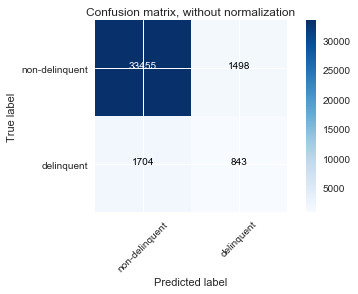

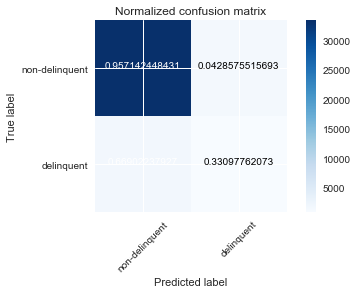

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 50, 'max...
auc-roc                                                0.697038
p_at_5                                                 0.434133
p_at_10                                                  0.2952
p_at_20                                                  0.3396
cnf                                [[33754, 1199], [1699, 848]]
runtime                                                0.439798
Name: 69, dtype: object
Confusion matrix, without normalization
[[33754  1199]
 [ 1699   848]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.67  0.33]]


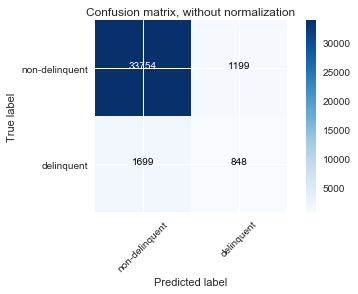

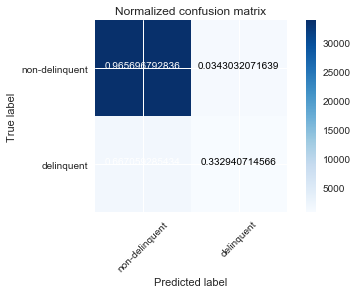

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                 0.65672
p_at_5                                                   0.4896
p_at_10                                                  0.5584
p_at_20                                                  0.3396
cnf                                [[33299, 1654], [1629, 918]]
runtime                                                 0.39847
Name: 70, dtype: object
Confusion matrix, without normalization
[[33299  1654]
 [ 1629   918]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.64  0.36]]


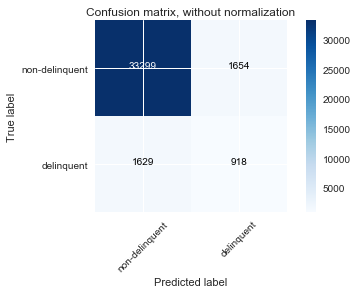

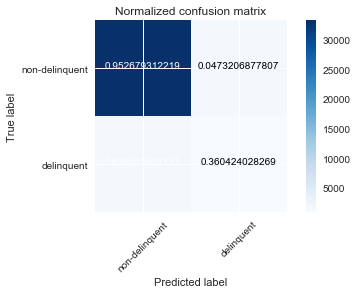

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                0.672108
p_at_5                                                 0.425067
p_at_10                                                0.369067
p_at_20                                                  0.3396
cnf                                [[33490, 1463], [1687, 860]]
runtime                                                0.365063
Name: 71, dtype: object
Confusion matrix, without normalization
[[33490  1463]
 [ 1687   860]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.66  0.34]]


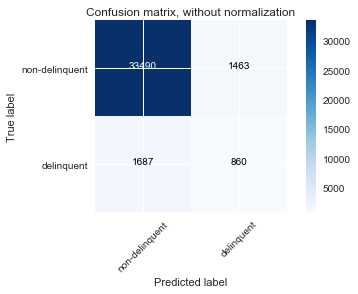

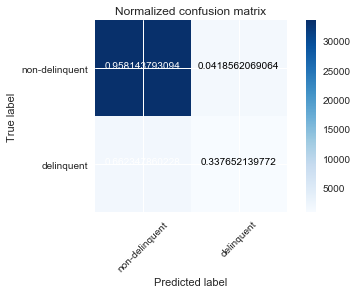

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                0.689573
p_at_5                                                 0.424533
p_at_10                                                0.289067
p_at_20                                                  0.3396
cnf                                [[33709, 1244], [1708, 839]]
runtime                                                0.407386
Name: 72, dtype: object
Confusion matrix, without normalization
[[33709  1244]
 [ 1708   839]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.67  0.33]]


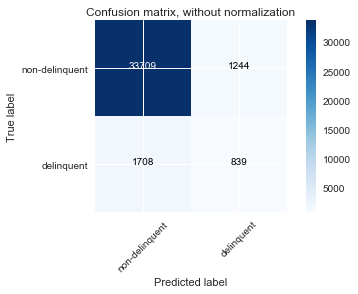

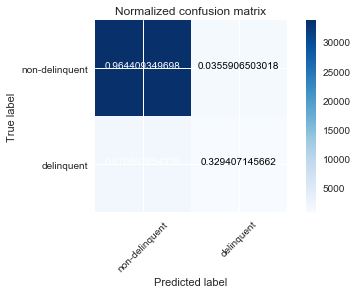

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                0.657641
p_at_5                                                   0.4896
p_at_10                                                0.575467
p_at_20                                                  0.3396
cnf                                [[33364, 1589], [1629, 918]]
runtime                                                0.346994
Name: 73, dtype: object
Confusion matrix, without normalization
[[33364  1589]
 [ 1629   918]]
Normalized confusion matrix
[[ 0.95  0.05]
 [ 0.64  0.36]]


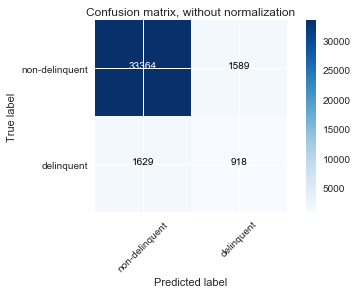

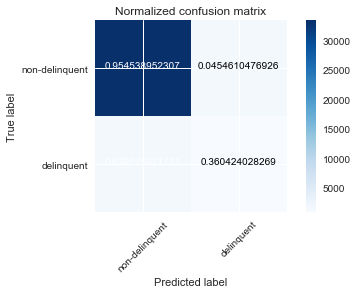

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                0.671788
p_at_5                                                 0.434133
p_at_10                                                0.380533
p_at_20                                                  0.3396
cnf                                [[33529, 1424], [1647, 900]]
runtime                                                0.429622
Name: 74, dtype: object
Confusion matrix, without normalization
[[33529  1424]
 [ 1647   900]]
Normalized confusion matrix
[[ 0.96  0.04]
 [ 0.65  0.35]]


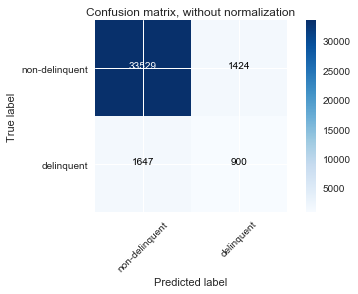

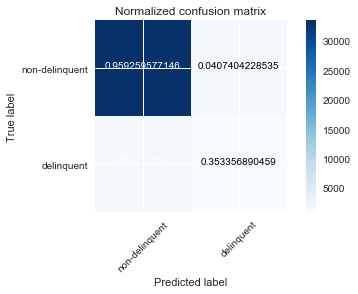

model_type                                                   DT
clf           DecisionTreeClassifier(class_weight=None, crit...
parameters    {'criterion': 'entropy', 'max_depth': 100, 'ma...
auc-roc                                                0.691987
p_at_5                                                 0.433067
p_at_10                                                0.290933
p_at_20                                                  0.3396
cnf                                [[33762, 1191], [1694, 853]]
runtime                                                0.416475
Name: 75, dtype: object
Confusion matrix, without normalization
[[33762  1191]
 [ 1694   853]]
Normalized confusion matrix
[[ 0.97  0.03]
 [ 0.67  0.33]]


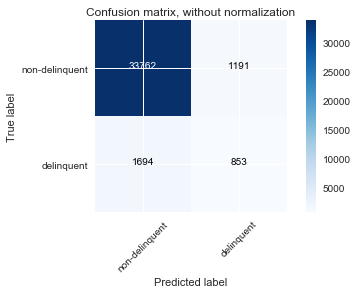

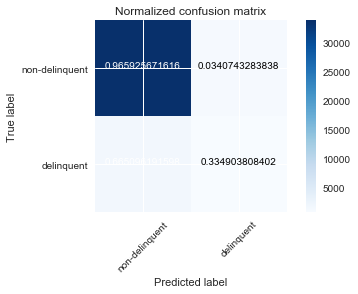

model_type                                                   GB
clf           ([DecisionTreeRegressor(criterion='friedman_ms...
parameters    {'learning_rate': 0.1, 'max_depth': 5, 'n_esti...
auc-roc                                                0.873045
p_at_5                                                 0.566933
p_at_10                                                  0.4256
p_at_20                                                0.249333
cnf                                  [[34937, 16], [2212, 335]]
runtime                                                 1.64414
Name: 76, dtype: object
Confusion matrix, without normalization
[[34937    16]
 [ 2212   335]]
Normalized confusion matrix
[[  1.00e+00   4.58e-04]
 [  8.68e-01   1.32e-01]]


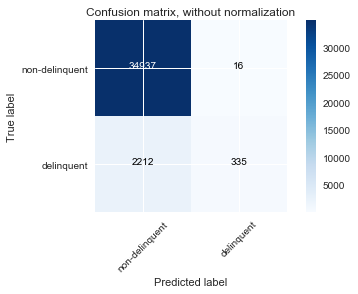

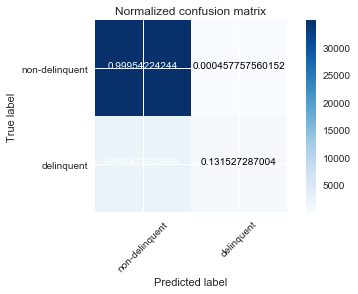

model_type                                                   GB
clf           ([DecisionTreeRegressor(criterion='friedman_ms...
parameters    {'learning_rate': 0.1, 'max_depth': 5, 'n_esti...
auc-roc                                                0.882031
p_at_5                                                   0.5744
p_at_10                                                0.386133
p_at_20                                                0.252933
cnf                                 [[34732, 221], [1813, 734]]
runtime                                                 15.1998
Name: 77, dtype: object
Confusion matrix, without normalization
[[34732   221]
 [ 1813   734]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.71  0.29]]


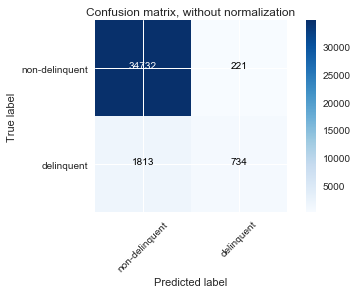

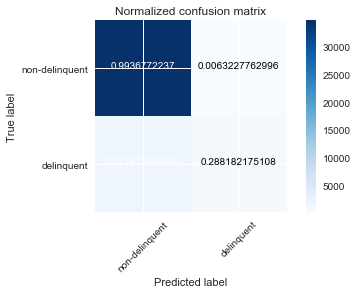

model_type                                                   LR
clf           LogisticRegression(C=10, class_weight=None, du...
parameters                          {'C': 0.1, 'penalty': 'l1'}
auc-roc                                                0.663218
p_at_5                                                 0.140267
p_at_10                                                0.133867
p_at_20                                                0.121333
cnf                                   [[34928, 25], [2510, 37]]
runtime                                                0.298405
Name: 78, dtype: object
Confusion matrix, without normalization
[[34928    25]
 [ 2510    37]]
Normalized confusion matrix
[[  9.99e-01   7.15e-04]
 [  9.85e-01   1.45e-02]]


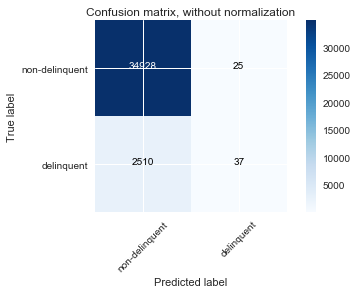

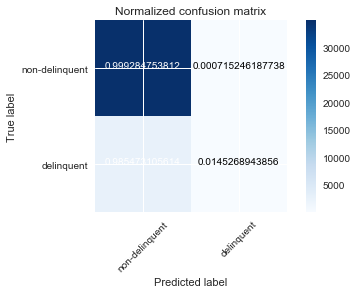

model_type                                                   LR
clf           LogisticRegression(C=10, class_weight=None, du...
parameters                            {'C': 1, 'penalty': 'l1'}
auc-roc                                                0.663466
p_at_5                                                   0.1408
p_at_10                                                0.134133
p_at_20                                                0.121467
cnf                                   [[34928, 25], [2510, 37]]
runtime                                                0.341127
Name: 79, dtype: object
Confusion matrix, without normalization
[[34928    25]
 [ 2510    37]]
Normalized confusion matrix
[[  9.99e-01   7.15e-04]
 [  9.85e-01   1.45e-02]]


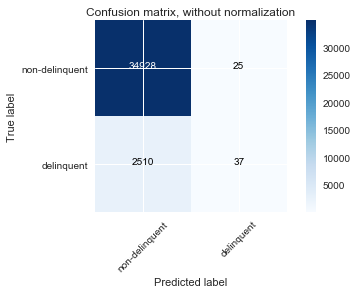

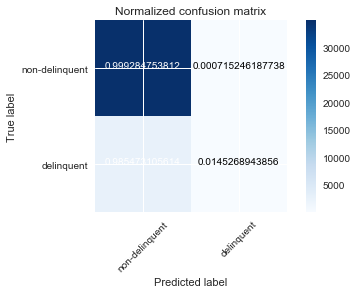

model_type                                                   LR
clf           LogisticRegression(C=10, class_weight=None, du...
parameters                           {'C': 10, 'penalty': 'l1'}
auc-roc                                                0.663456
p_at_5                                                   0.1408
p_at_10                                                0.134133
p_at_20                                                0.121467
cnf                                   [[34928, 25], [2510, 37]]
runtime                                                0.375792
Name: 80, dtype: object
Confusion matrix, without normalization
[[34928    25]
 [ 2510    37]]
Normalized confusion matrix
[[  9.99e-01   7.15e-04]
 [  9.85e-01   1.45e-02]]


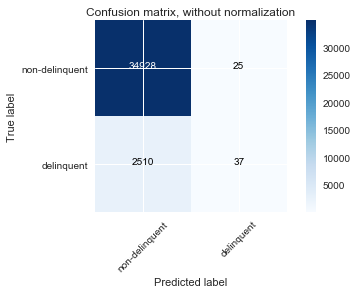

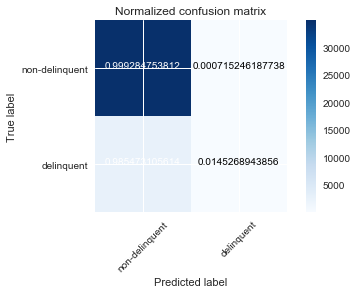

model_type                           NB
clf             GaussianNB(priors=None)
parameters                           {}
auc-roc                        0.659564
p_at_5                           0.2176
p_at_10                          0.1648
p_at_20                        0.130267
cnf           [[34921, 32], [2485, 62]]
runtime                       0.0404749
Name: 81, dtype: object
Confusion matrix, without normalization
[[34921    32]
 [ 2485    62]]
Normalized confusion matrix
[[  9.99e-01   9.16e-04]
 [  9.76e-01   2.43e-02]]


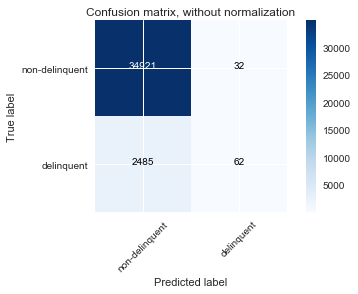

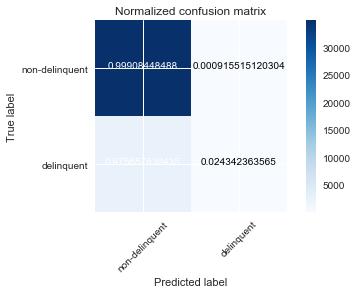

model_type                                                   GB
clf           ([DecisionTreeRegressor(criterion='friedman_ms...
parameters    {'learning_rate': 0.1, 'max_depth': 5, 'n_esti...
auc-roc                                                0.873045
p_at_5                                                 0.566933
p_at_10                                                  0.4256
p_at_20                                                0.249333
cnf                                  [[34937, 16], [2212, 335]]
runtime                                                  1.6651
Name: 82, dtype: object
Confusion matrix, without normalization
[[34937    16]
 [ 2212   335]]
Normalized confusion matrix
[[  1.00e+00   4.58e-04]
 [  8.68e-01   1.32e-01]]


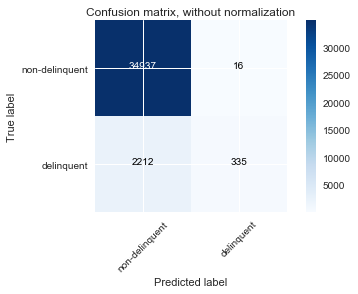

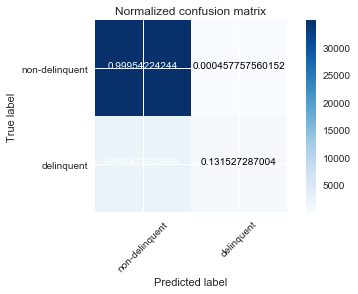

model_type                                                   GB
clf           ([DecisionTreeRegressor(criterion='friedman_ms...
parameters    {'learning_rate': 0.1, 'max_depth': 5, 'n_esti...
auc-roc                                                0.882008
p_at_5                                                   0.5744
p_at_10                                                0.385867
p_at_20                                                0.252933
cnf                                 [[34732, 221], [1813, 734]]
runtime                                                 14.8875
Name: 83, dtype: object
Confusion matrix, without normalization
[[34732   221]
 [ 1813   734]]
Normalized confusion matrix
[[ 0.99  0.01]
 [ 0.71  0.29]]


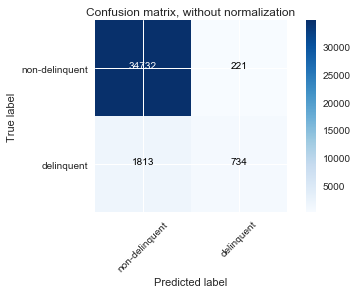

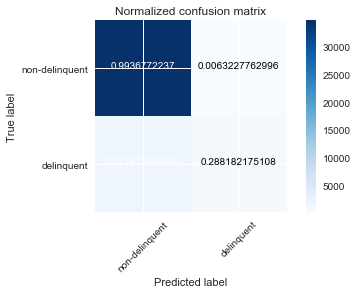

In [27]:

# Compute confusion matrix
def plot_cnf(cnf_matrix=None, classes=None, y_test=None,y_hat=None):
    if y_test:
        cnf_matrix = confusion_matrix(y_test, y_hat)
        if not classes:
            classes = y_test.unique()
            
            
    np.set_printoptions(precision=2)

    # Plot non-normalized confusion matrix
    pl.figure()
    ev.plot_confusion_matrix(cnf_matrix, classes=classes,
                          title='Confusion matrix, without normalization')

    # Plot normalized confusion matrix
    pl.figure()
    ev.plot_confusion_matrix(cnf_matrix, classes=classes, normalize=True,
                          title='Normalized confusion matrix')


    pl.show()

for i in range(len(results_df)):
    row = results_df.iloc[i,:]
    print(row)
    plot_cnf(row.loc["cnf"], classes=["non-delinquent","delinquent"])

In [25]:
results_df

,model_type,clf,parameters,auc-roc,p_at_5,p_at_10,p_at_20,cnf,runtime
0,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.868082,0.548800,0.373067,0.245867,"[[34802, 151], [2045, 502]]",0.644746
1,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 5, 'max_features': 'sqrt', 'min_...",0.870229,0.569600,0.381067,0.246800,"[[34844, 109], [2063, 484]]",5.075012
2,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.781366,0.529067,0.378933,0.244133,"[[34607, 346], [1837, 710]]",1.265795
3,RF,"(DecisionTreeClassifier(class_weight=None, cri...","{'max_depth': 50, 'max_features': 'sqrt', 'min...",0.848884,0.545067,0.363733,0.230800,"[[34646, 307], [1779, 768]]",10.701249
4,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.699723,0.759467,0.379733,0.256000,"[[34953, 0], [2547, 0]]",0.045804
5,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.043671
6,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.699723,0.759467,0.379733,0.256000,"[[34953, 0], [2547, 0]]",0.037546
7,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.036608
8,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.036532
9,DT,"DecisionTreeClassifier(class_weight=None, crit...","{'criterion': 'gini', 'max_depth': 1, 'max_fea...",0.653223,0.464000,0.672533,0.339600,"[[34953, 0], [2547, 0]]",0.028323
